# **Capstone Game**
_Welcome to the Capstone Game - A stock market simulation!_

_This notebook lets you put **real quant strategies** to the test against a simulated market where you can't lose nor hold for 18 years!_

### **Import Libraries + Scripts + Classes**

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")

from game_scripts.market_sim import market_simulation
from game_scripts.player_portfolio import PlayerPortfolio

from strategies.sma_crossover_strategy import generate_signals as sma_signals
from strategies.ewma_crossover_strategy import generate_signals as ewma_signals
from strategies.macd_strategy import generate_signals as macd_signals
from strategies.rsi_bollinger_strategy import generate_signals as rsi_signals
from strategies.atr_breakout_strategy import generate_signals as atr_signals

### **Initialize the Game**

In [41]:
# Generate the fake stock market
market_df = market_simulation(days=130)

# Create the player's portfolio
player = PlayerPortfolio(starting_cash=10000)

# Timeframe
current_day = 30
max_day = 130

### **Strategy Functionality**

In [42]:
strategy_map = {
    'sma': sma_signals,
    'ewma': ewma_signals,
    'macd': macd_signals,
    'rsi': rsi_signals,
    'atr': atr_signals
}

### **Helper Functions**
_Will be getting moved to a separate script_

In [43]:
def show_market_prices(active_date, market_df):
    today = market_df[market_df['Date'] == active_date]
    display(today[['Ticker', 'Stock', 'Close', 'Mode']])

def get_current_prices(active_date, market_df):
    today = market_df[market_df['Date'] == active_date]
    return dict(zip(today['Ticker'], today['Close']))

def plot_market_trends(active_date, market_df, player_ticker):
    dates = market_df['Date'].unique()
    current_idx = list(dates).index(active_date)
    active_dates = dates[:current_idx+1]

    player_df = market_df[(market_df['Ticker'] == player_ticker) & (market_df['Date'].isin(active_dates))]

    plt.figure(figsize=(12,6))
    sns.lineplot(data=player_df, x='Date', y='Close', label=player_ticker)
    sns.scatterplot(data=player_df, x='Date', y='Close', color='black', s=100, label='Price Points')
    plt.title(f'{player_ticker} Price Trend (Start to Day {current_idx - 29})')
    plt.xlabel('Date')
    plt.ylabel('Close Price ($)')
    plt.grid(True)
    plt.legend(title='Legend')
    plt.show()

def simulate_strategy_portfolio(df, strategy_func, starting_cash=10000):
    df, _ = strategy_func(df.copy())
    df['Portfolio'] = np.nan

    cash = starting_cash
    holdings = 0
    portfolio_values = []

    for i, row in df.iterrows():
        price = row['Close']
        signal = row['Signal']
        if signal == 1 and cash >= price:
            shares = int(cash // price)
            holdings += shares
            cash -= shares * price
        elif signal == -1 and holdings > 0:
            cash += holdings * price
            holdings = 0
        total_value = cash + holdings * price
        portfolio_values.append(total_value)

    df['Portfolio'] = portfolio_values
    return df


### **Game Loop**

Your assigned stock is: Cencorp (CNCP)

Day 1 of 100
Trading: Cencorp (CNCP) — 2025-01-31


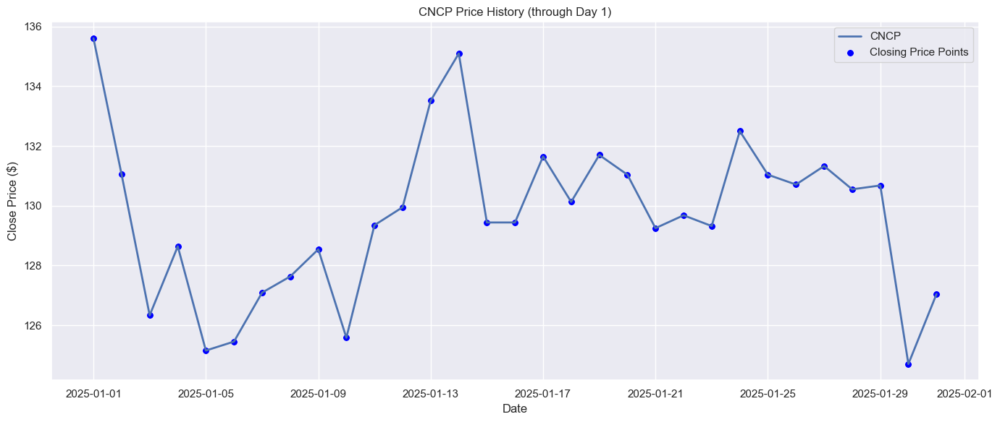

Today's Price: $127.04
Current Holdings:
  None
Cash Balance: $10000.00
Bought 60 shares of CNCP at $127.04.

Day 2 of 100
Trading: Cencorp (CNCP) — 2025-02-01


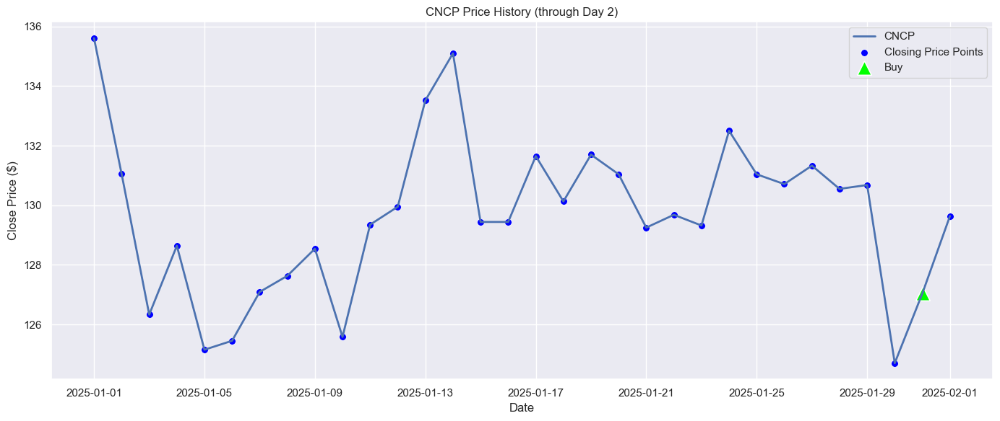

Today's Price: $129.64
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2377.60
Sold 60 shares of CNCP at $129.64.

Day 3 of 100
Trading: Cencorp (CNCP) — 2025-02-02


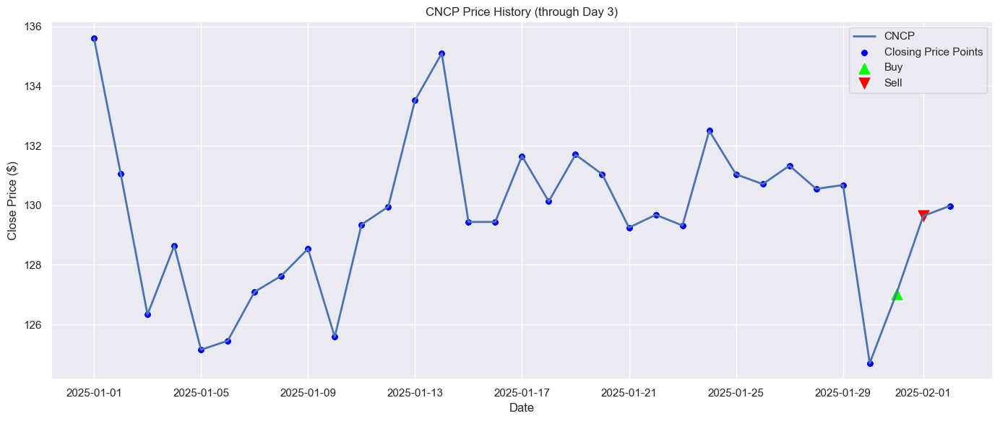

Today's Price: $129.98
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10156.00
You hold your position...

Day 4 of 100
Trading: Cencorp (CNCP) — 2025-02-03


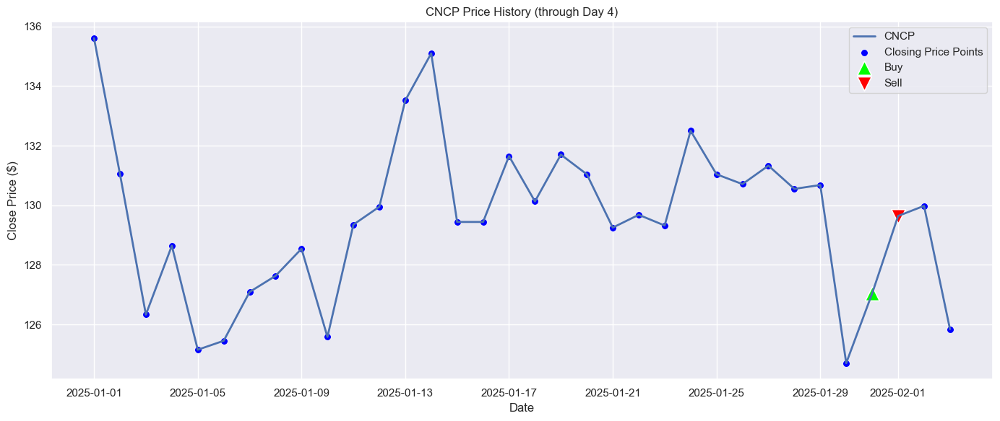

Today's Price: $125.84
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10156.00
You hold your position...

Day 5 of 100
Trading: Cencorp (CNCP) — 2025-02-04


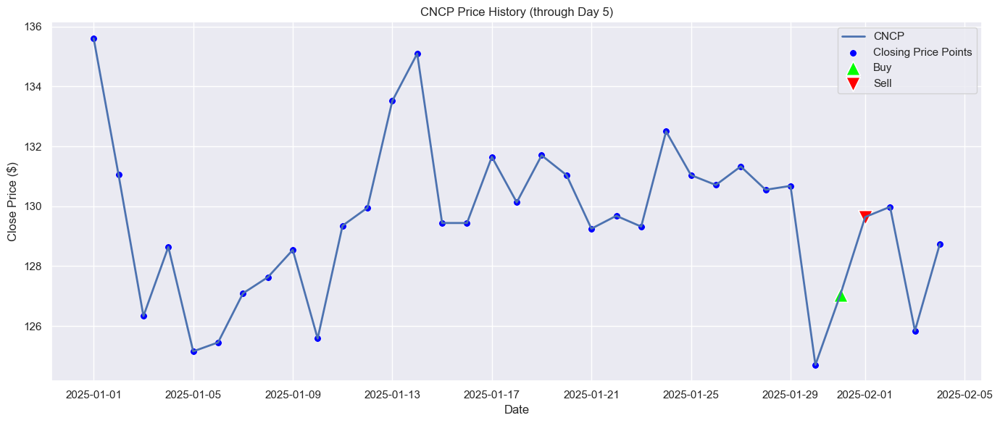

Today's Price: $128.74
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10156.00
You hold your position...

Day 6 of 100
Trading: Cencorp (CNCP) — 2025-02-05


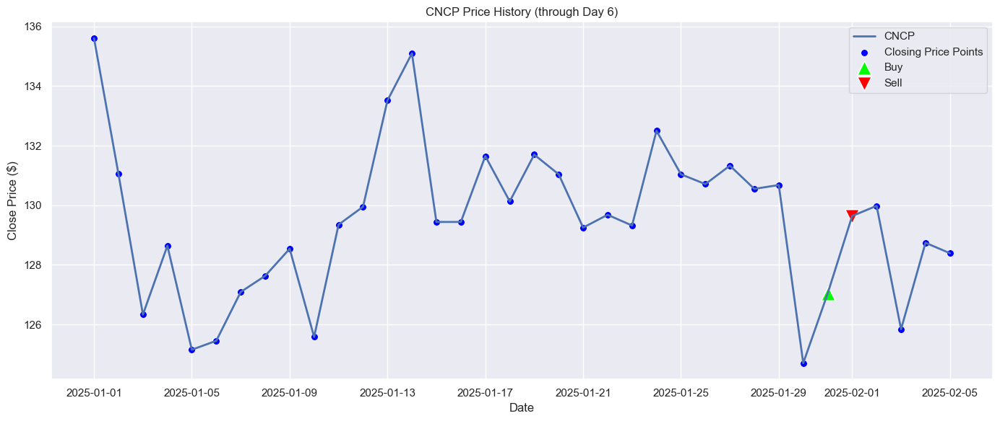

Today's Price: $128.39
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10156.00
Bought 70 shares of CNCP at $128.39.

Day 7 of 100
Trading: Cencorp (CNCP) — 2025-02-06


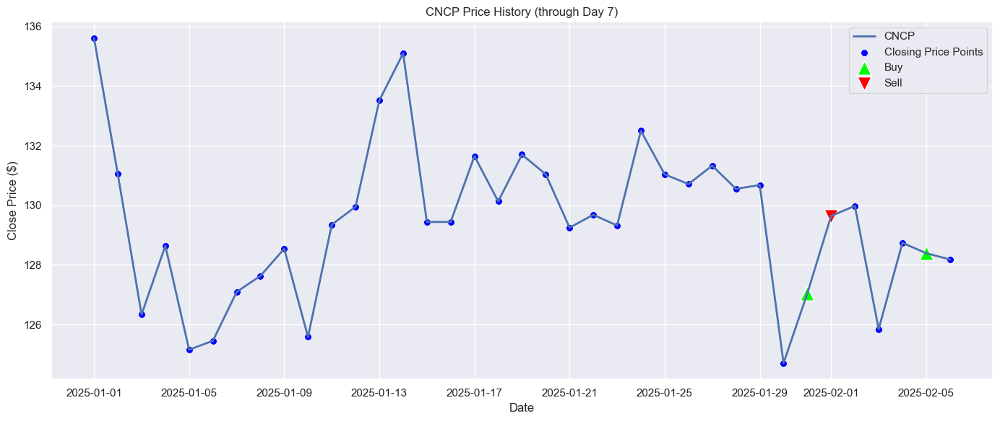

Today's Price: $128.18
Current Holdings:
  CNCP: 70 shares
Cash Balance: $1168.70
You hold your position...

Day 8 of 100
Trading: Cencorp (CNCP) — 2025-02-07


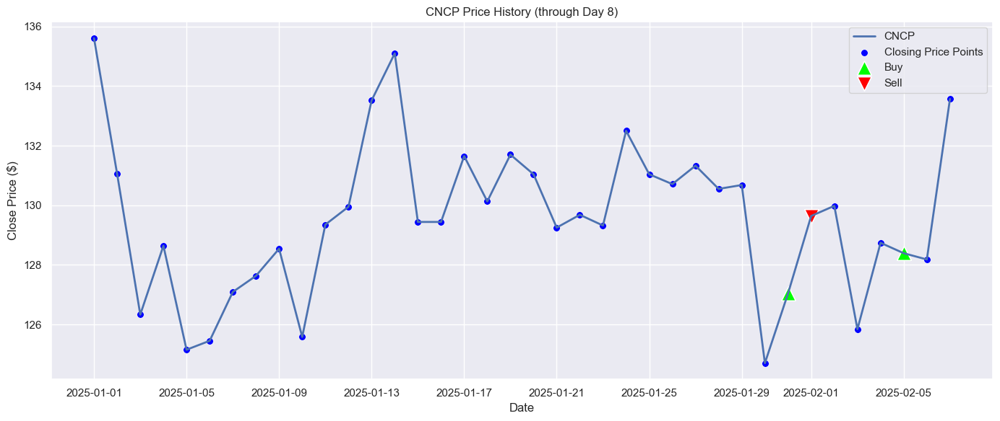

Today's Price: $133.57
Current Holdings:
  CNCP: 70 shares
Cash Balance: $1168.70
Sold 70 shares of CNCP at $133.57.

Day 9 of 100
Trading: Cencorp (CNCP) — 2025-02-08


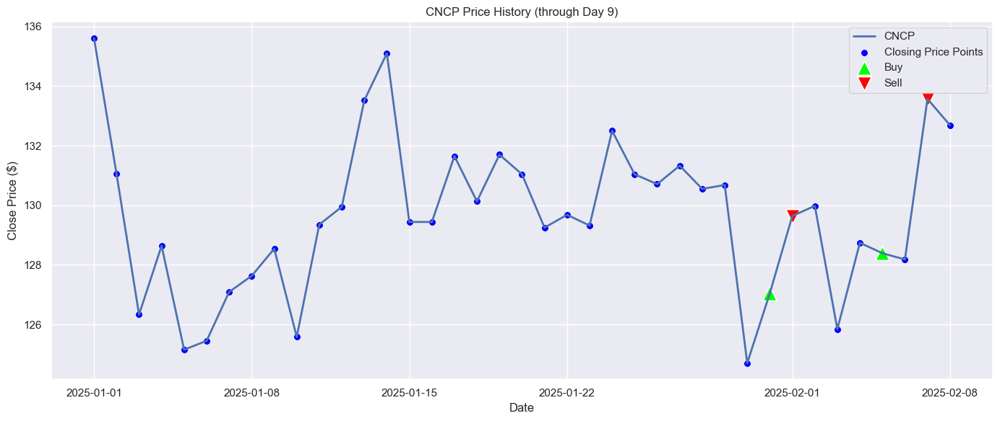

Today's Price: $132.69
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
Invalid input. Try again.

Day 9 of 100
Trading: Cencorp (CNCP) — 2025-02-08


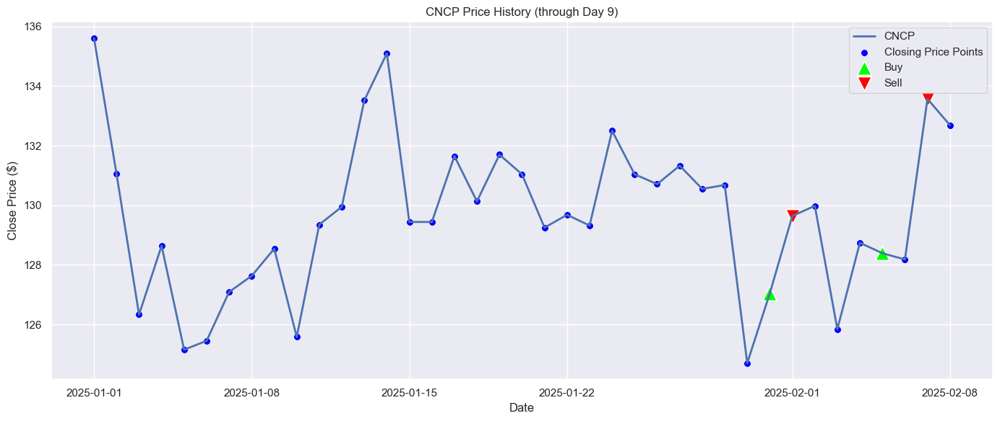

Today's Price: $132.69
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
You hold your position...

Day 10 of 100
Trading: Cencorp (CNCP) — 2025-02-09


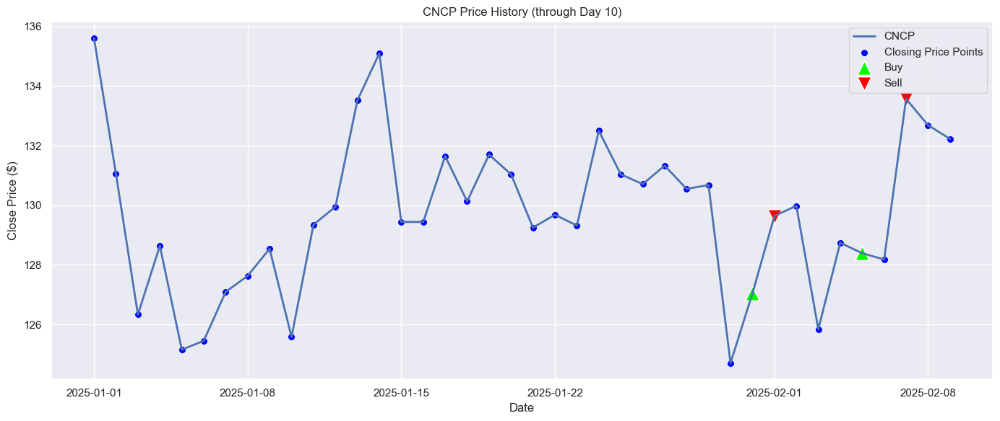

Today's Price: $132.23
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
You hold your position...

Day 11 of 100
Trading: Cencorp (CNCP) — 2025-02-10


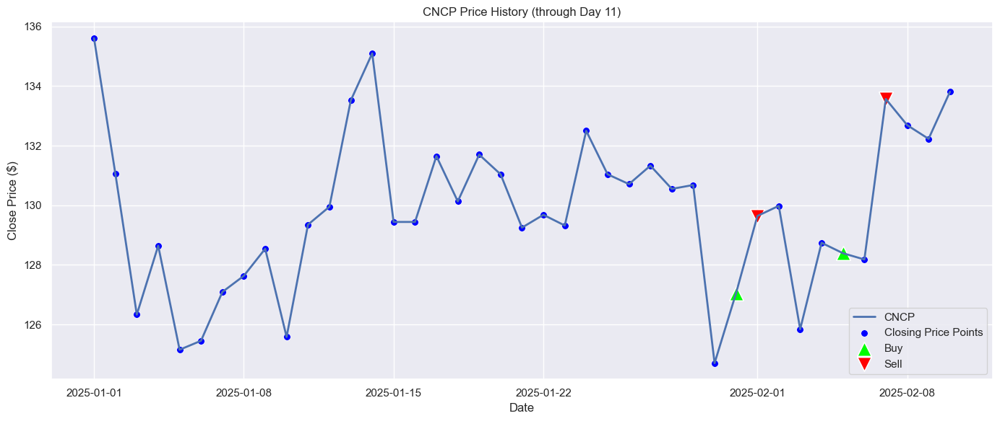

Today's Price: $133.81
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
You hold your position...

Day 12 of 100
Trading: Cencorp (CNCP) — 2025-02-11


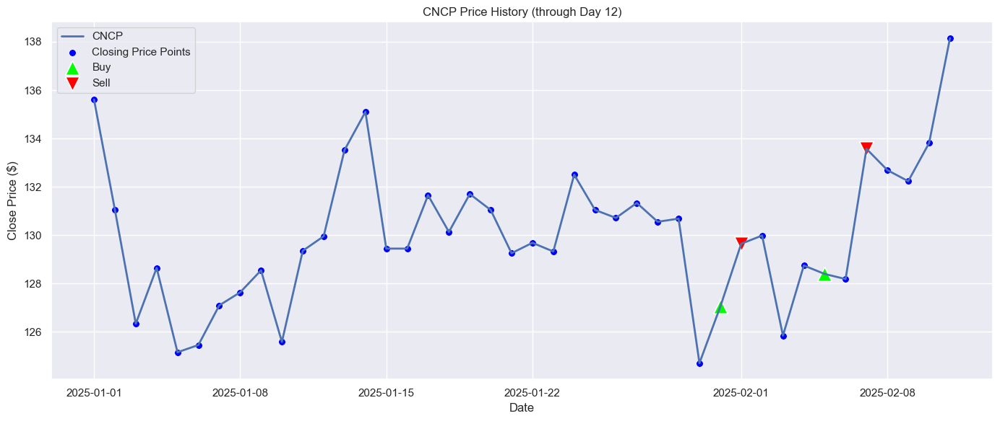

Today's Price: $138.15
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
You hold your position...

Day 13 of 100
Trading: Cencorp (CNCP) — 2025-02-12


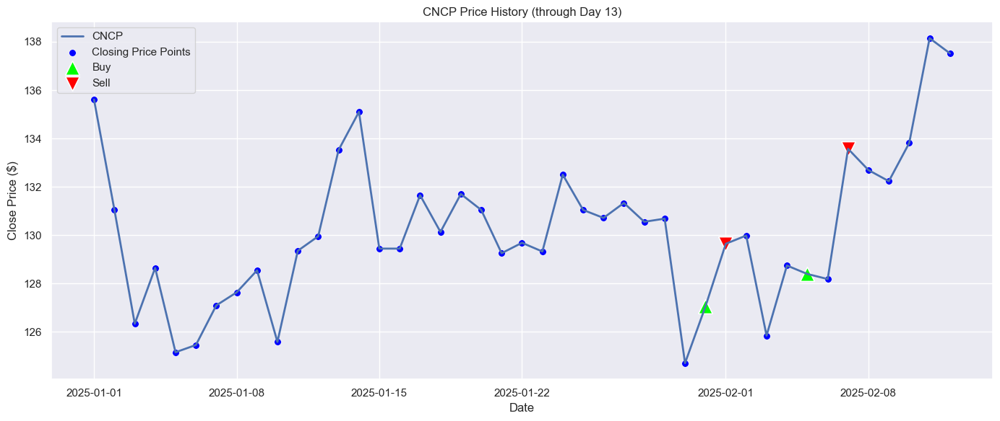

Today's Price: $137.52
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
You hold your position...

Day 14 of 100
Trading: Cencorp (CNCP) — 2025-02-13


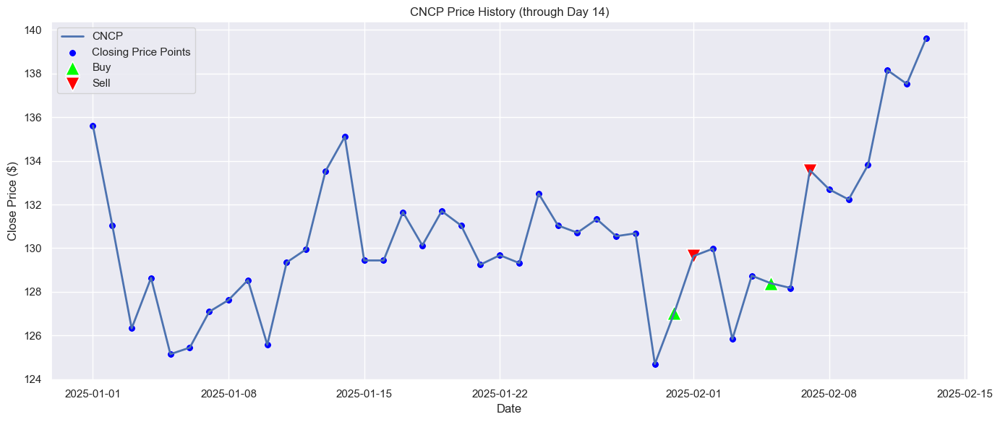

Today's Price: $139.61
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
You hold your position...

Day 15 of 100
Trading: Cencorp (CNCP) — 2025-02-14


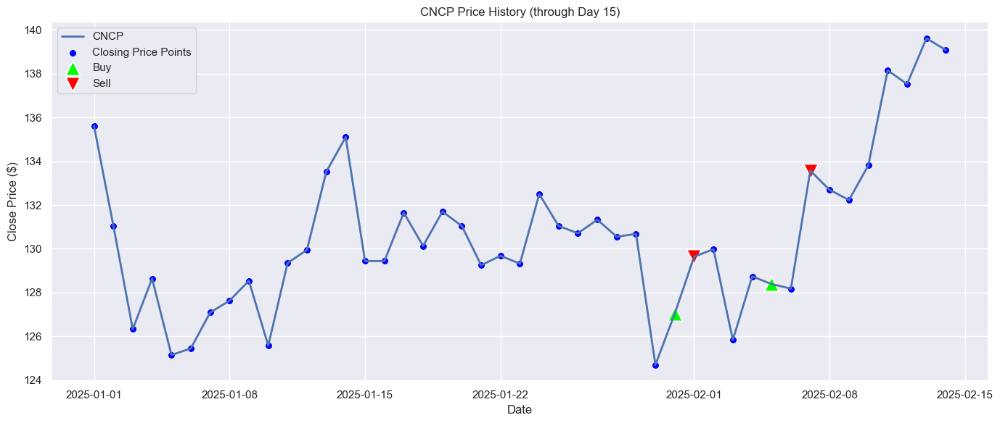

Today's Price: $139.08
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10518.60
Bought 75 shares of CNCP at $139.08.

Day 16 of 100
Trading: Cencorp (CNCP) — 2025-02-15


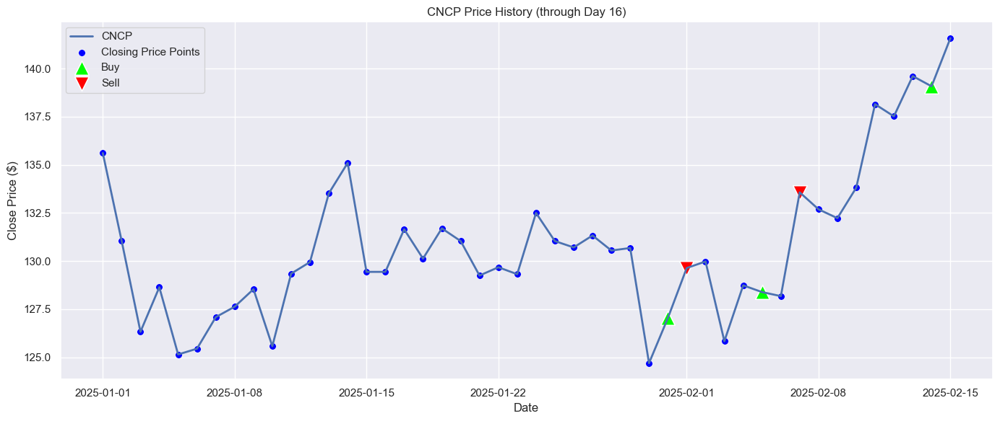

Today's Price: $141.58
Current Holdings:
  CNCP: 75 shares
Cash Balance: $87.60
Sold 75 shares of CNCP at $141.58.

Day 17 of 100
Trading: Cencorp (CNCP) — 2025-02-16


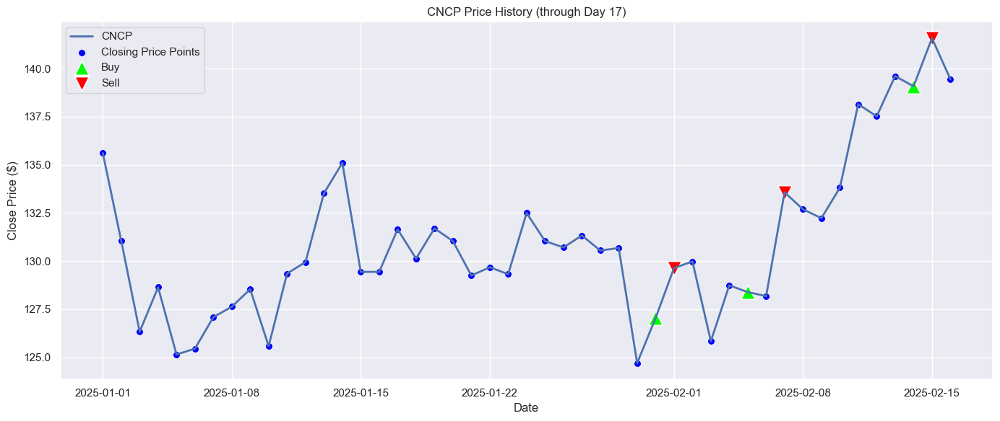

Today's Price: $139.45
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 18 of 100
Trading: Cencorp (CNCP) — 2025-02-17


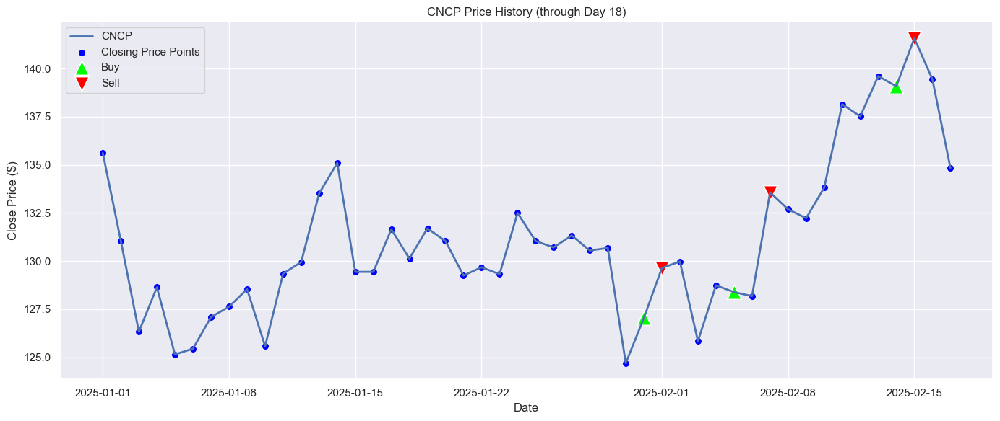

Today's Price: $134.84
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 19 of 100
Trading: Cencorp (CNCP) — 2025-02-18


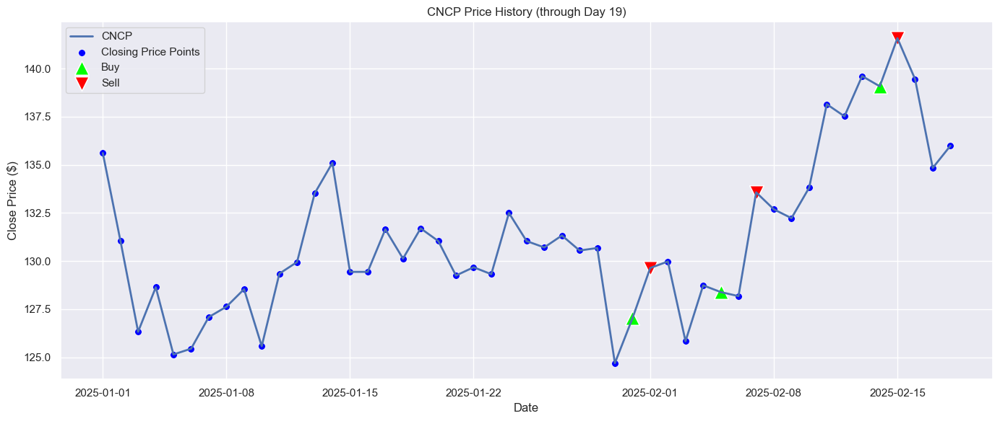

Today's Price: $135.99
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 20 of 100
Trading: Cencorp (CNCP) — 2025-02-19


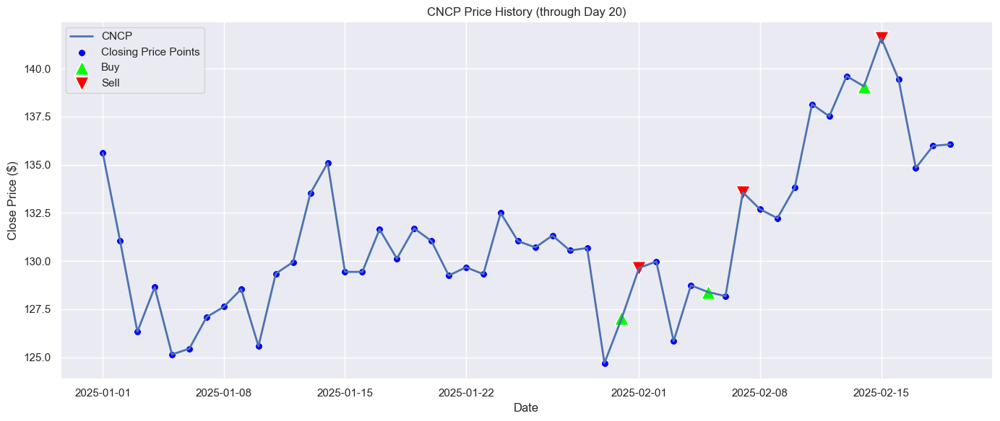

Today's Price: $136.06
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 21 of 100
Trading: Cencorp (CNCP) — 2025-02-20


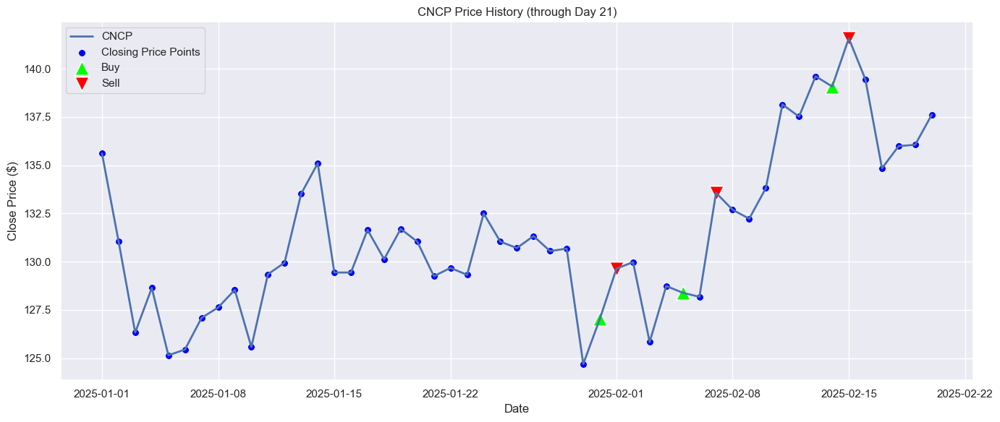

Today's Price: $137.62
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 22 of 100
Trading: Cencorp (CNCP) — 2025-02-21


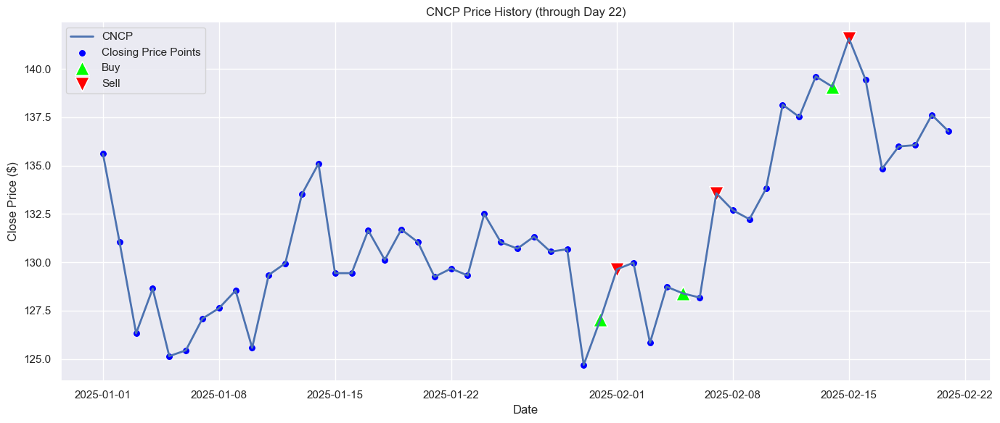

Today's Price: $136.78
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 23 of 100
Trading: Cencorp (CNCP) — 2025-02-22


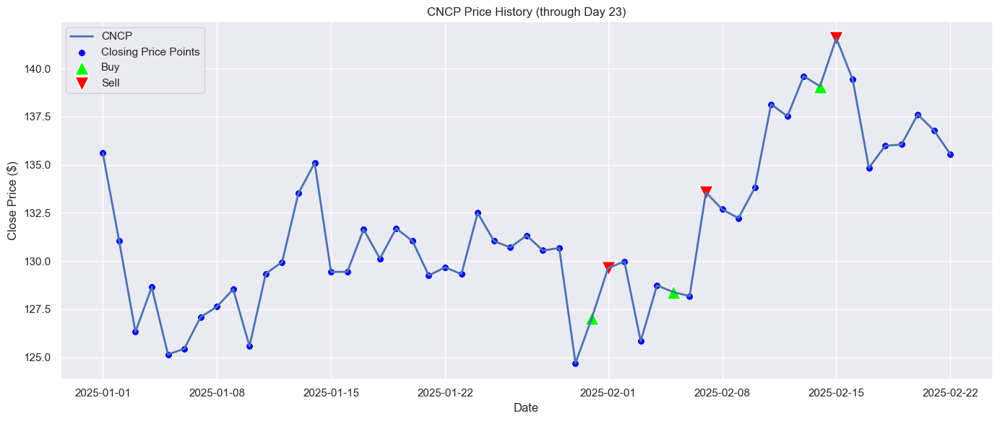

Today's Price: $135.55
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 24 of 100
Trading: Cencorp (CNCP) — 2025-02-23


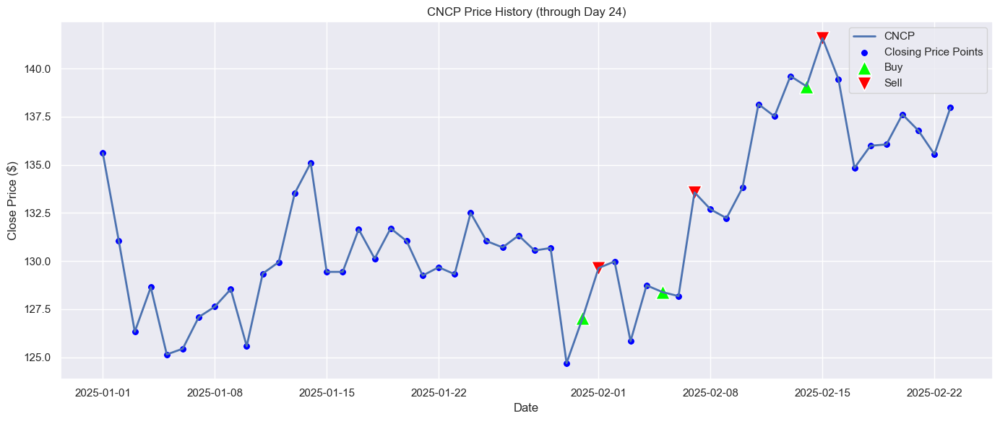

Today's Price: $137.97
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 25 of 100
Trading: Cencorp (CNCP) — 2025-02-24


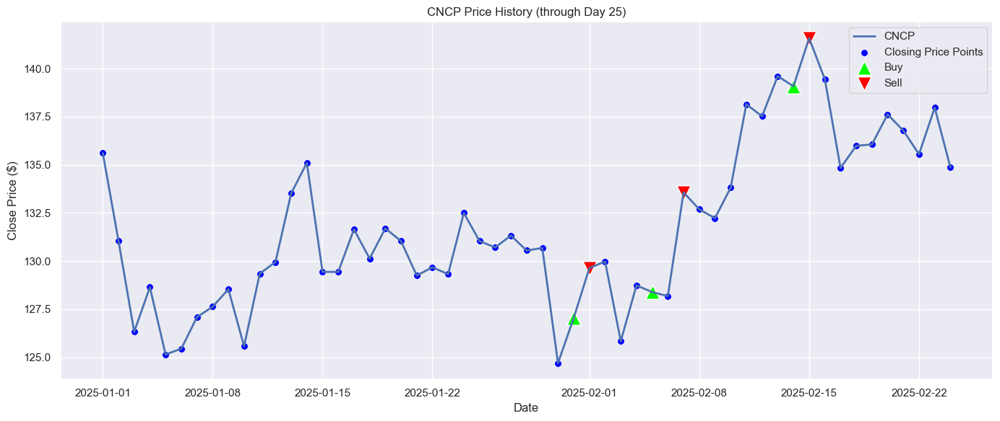

Today's Price: $134.87
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
You hold your position...

Day 26 of 100
Trading: Cencorp (CNCP) — 2025-02-25


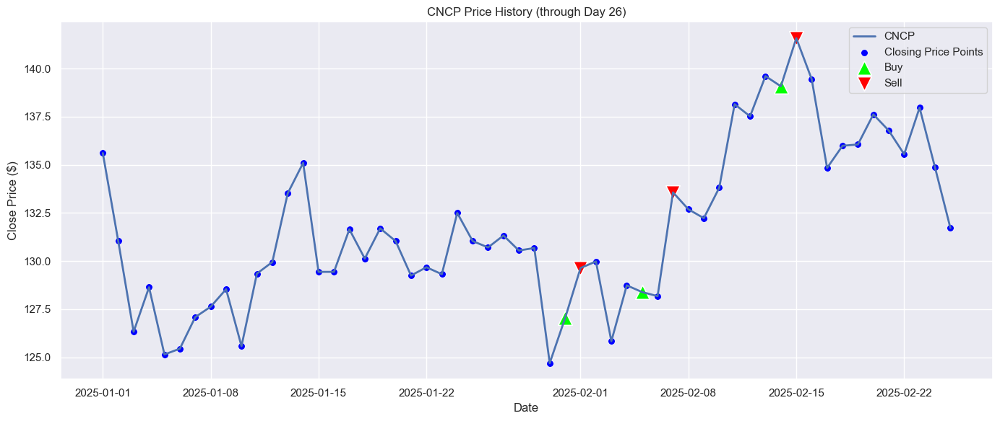

Today's Price: $131.72
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10706.10
Bought 60 shares of CNCP at $131.72.

Day 27 of 100
Trading: Cencorp (CNCP) — 2025-02-26


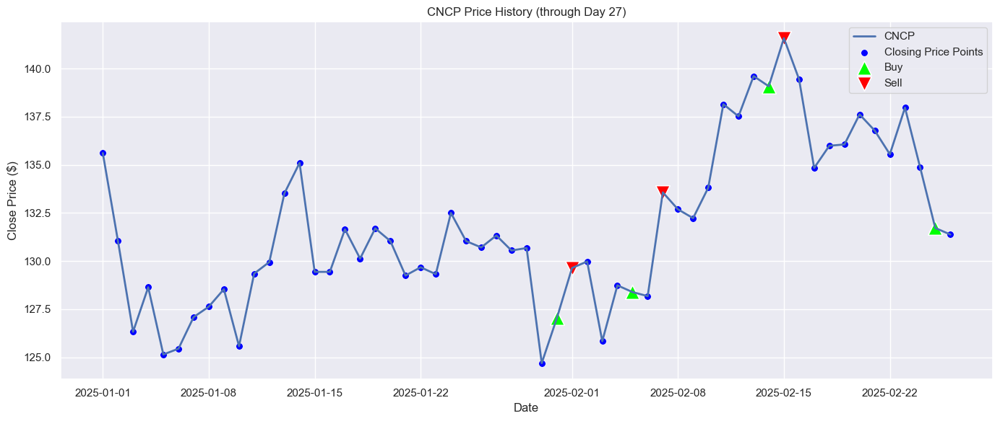

Today's Price: $131.38
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 28 of 100
Trading: Cencorp (CNCP) — 2025-02-27


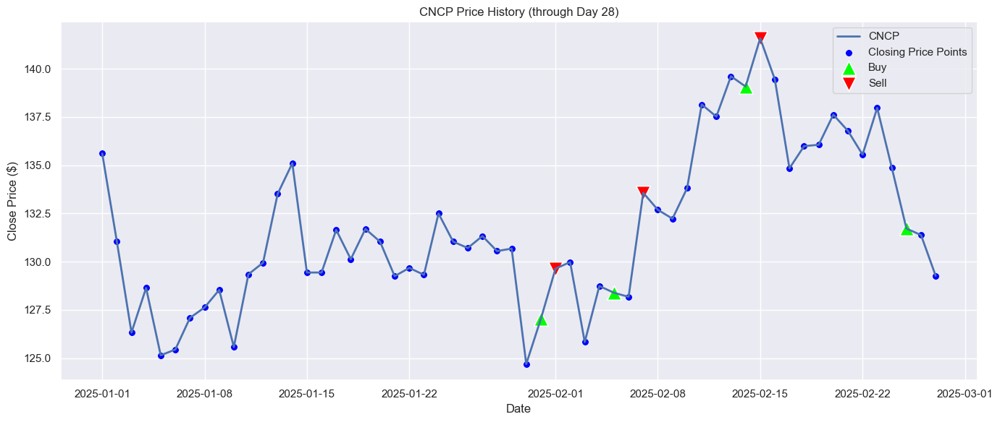

Today's Price: $129.27
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 29 of 100
Trading: Cencorp (CNCP) — 2025-02-28


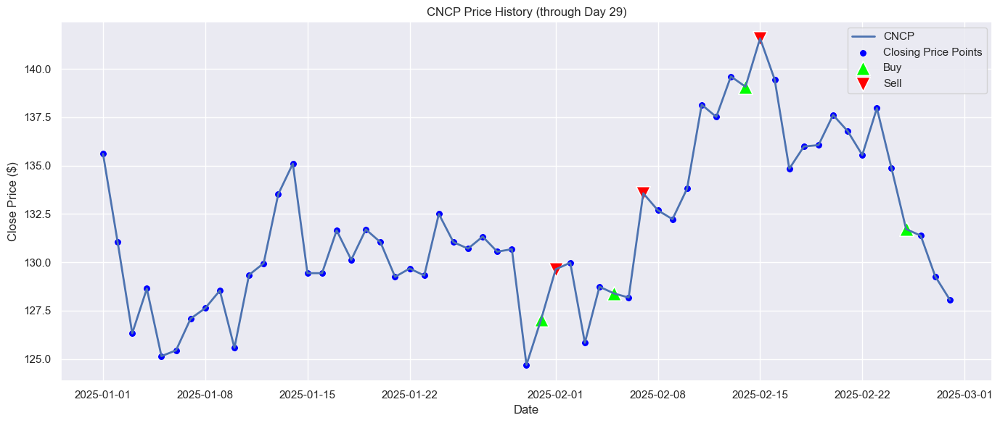

Today's Price: $128.06
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 30 of 100
Trading: Cencorp (CNCP) — 2025-03-01


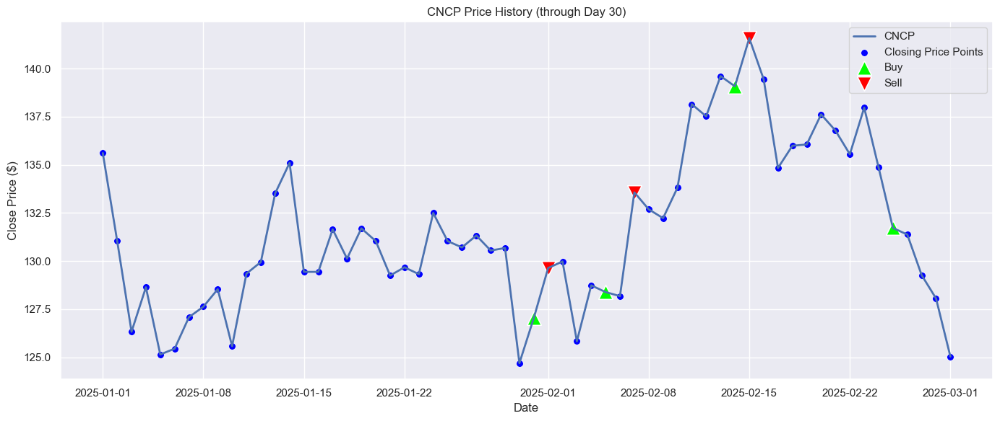

Today's Price: $125.04
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 31 of 100
Trading: Cencorp (CNCP) — 2025-03-02


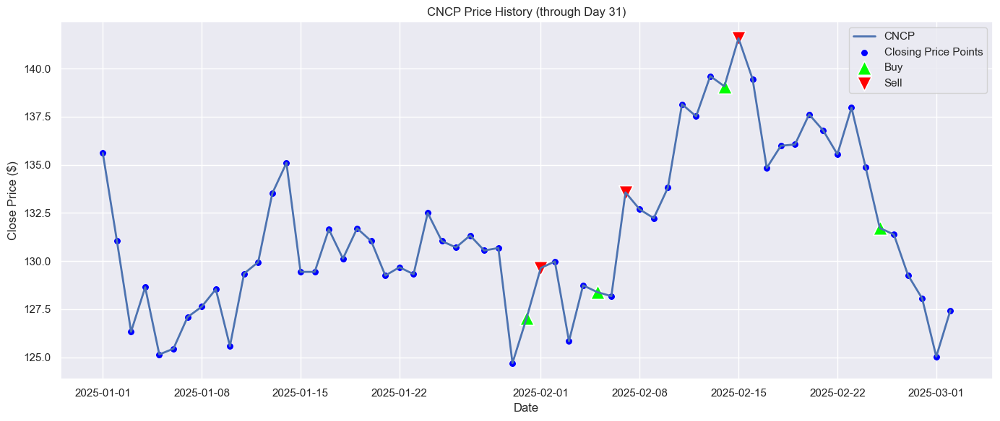

Today's Price: $127.44
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 32 of 100
Trading: Cencorp (CNCP) — 2025-03-03


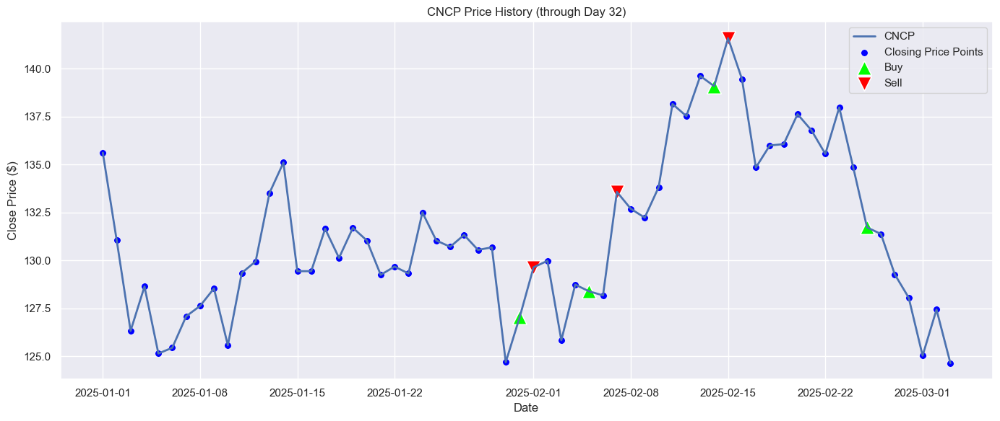

Today's Price: $124.65
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 33 of 100
Trading: Cencorp (CNCP) — 2025-03-04


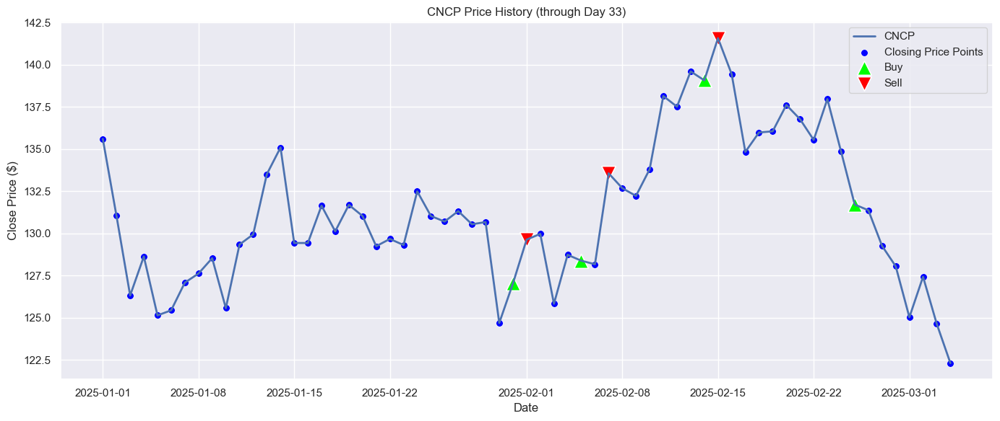

Today's Price: $122.32
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 34 of 100
Trading: Cencorp (CNCP) — 2025-03-05


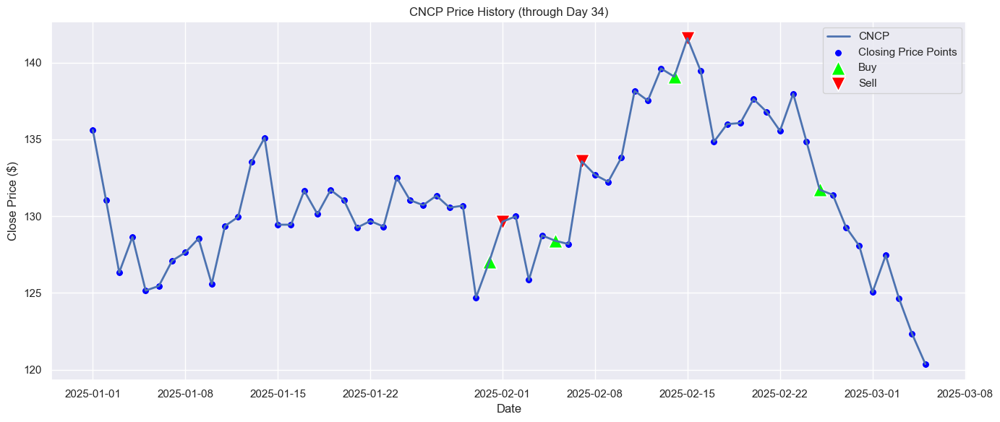

Today's Price: $120.37
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 35 of 100
Trading: Cencorp (CNCP) — 2025-03-06


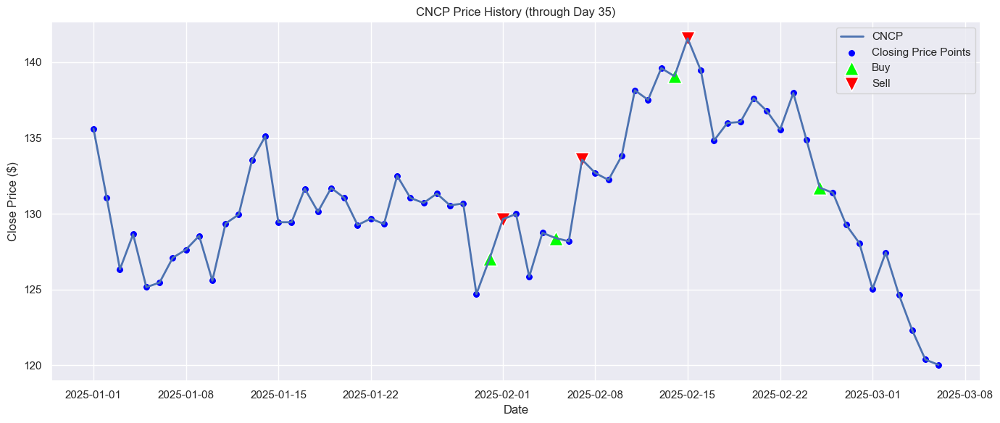

Today's Price: $120.02
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 36 of 100
Trading: Cencorp (CNCP) — 2025-03-07


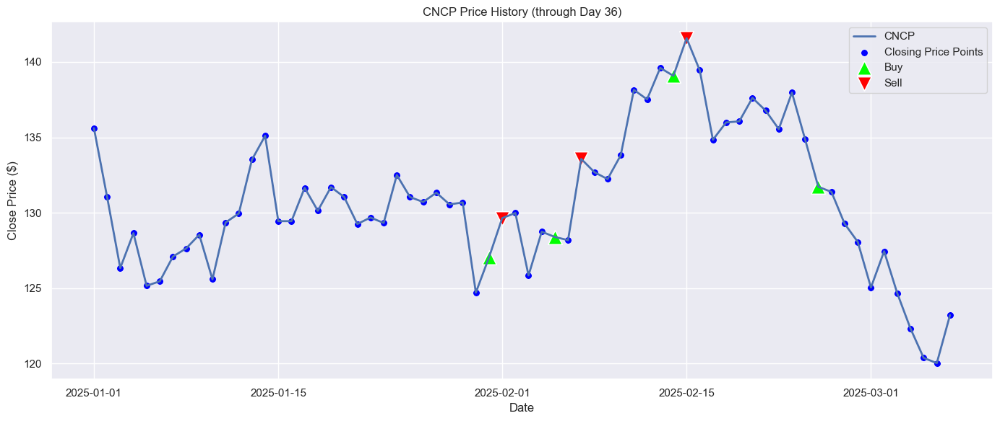

Today's Price: $123.20
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 37 of 100
Trading: Cencorp (CNCP) — 2025-03-08


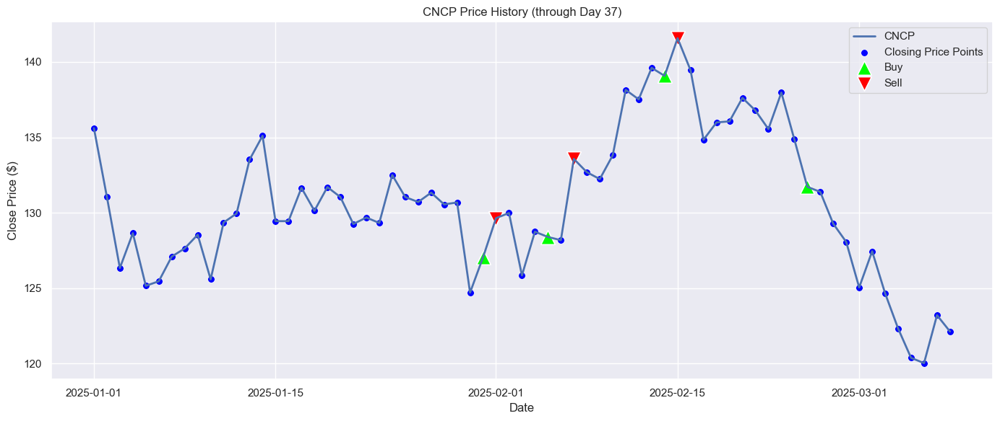

Today's Price: $122.12
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 38 of 100
Trading: Cencorp (CNCP) — 2025-03-09


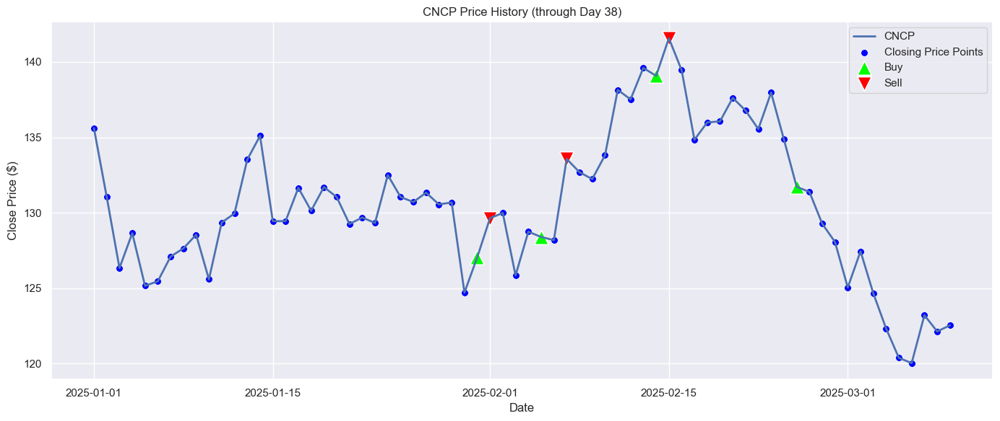

Today's Price: $122.53
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 39 of 100
Trading: Cencorp (CNCP) — 2025-03-10


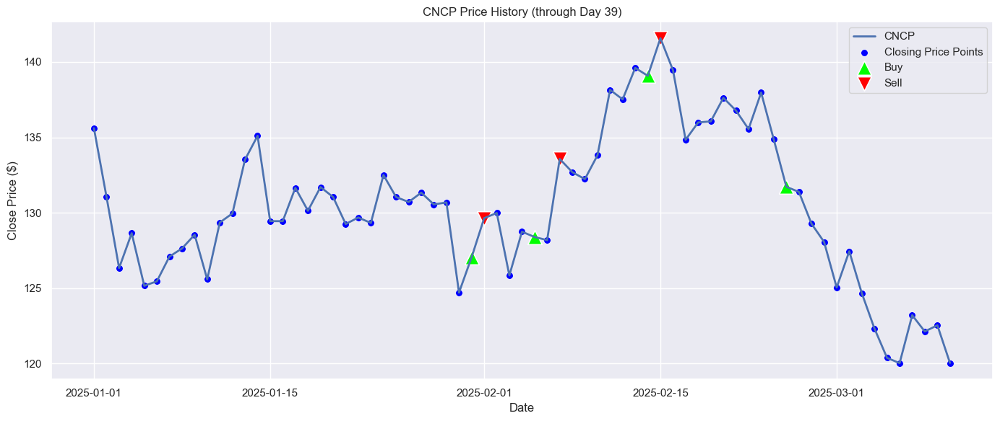

Today's Price: $120.03
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 40 of 100
Trading: Cencorp (CNCP) — 2025-03-11


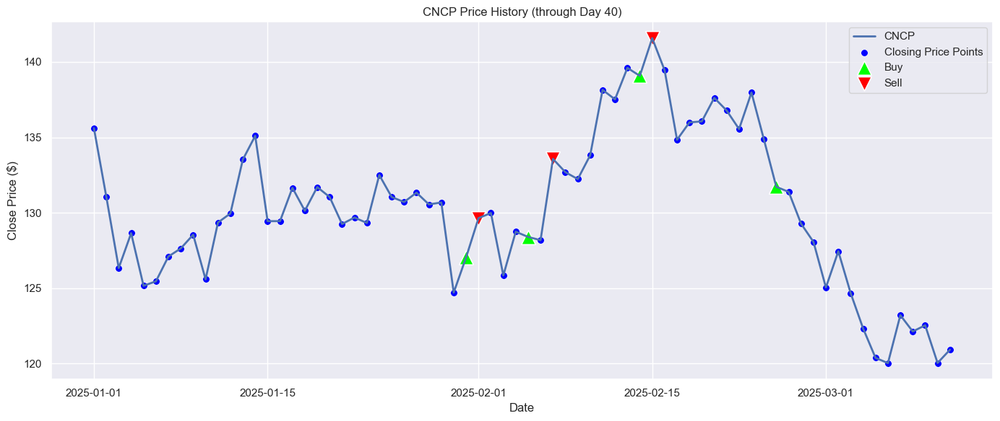

Today's Price: $120.91
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 41 of 100
Trading: Cencorp (CNCP) — 2025-03-12


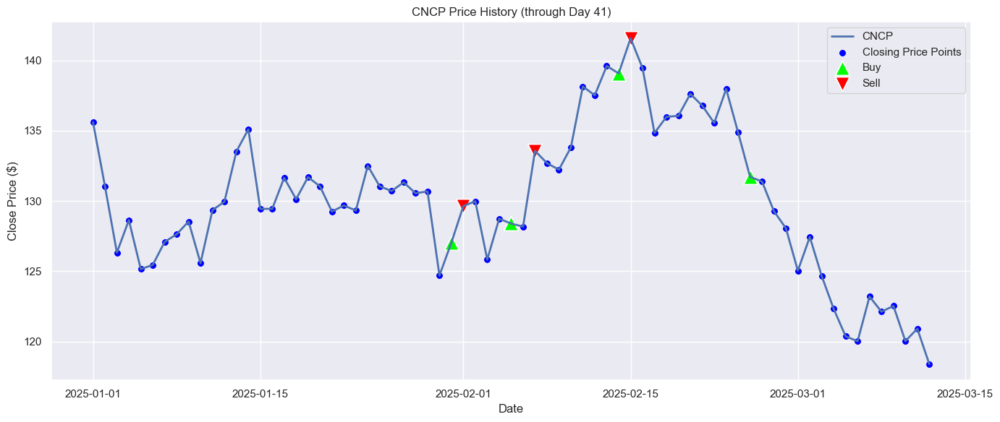

Today's Price: $118.40
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 42 of 100
Trading: Cencorp (CNCP) — 2025-03-13


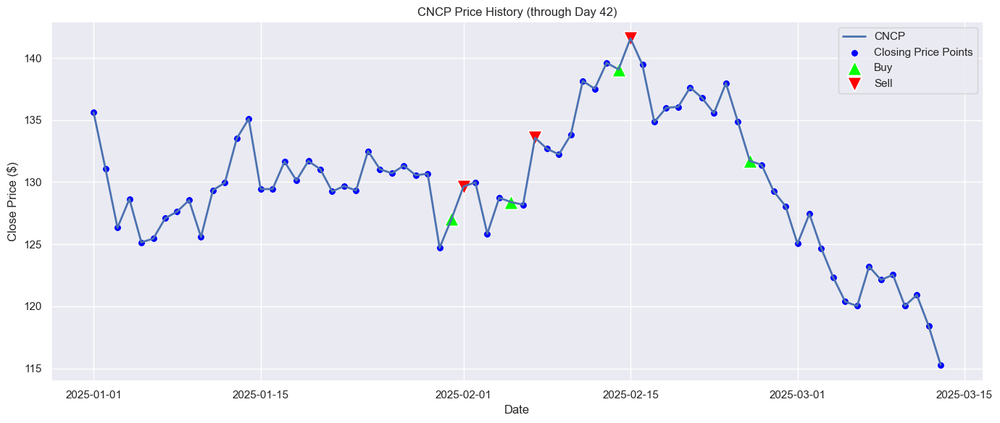

Today's Price: $115.28
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 43 of 100
Trading: Cencorp (CNCP) — 2025-03-14


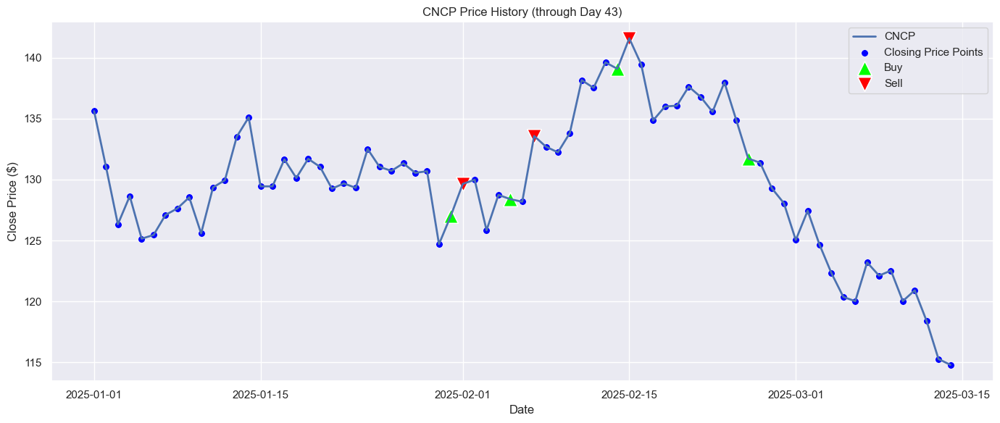

Today's Price: $114.80
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 44 of 100
Trading: Cencorp (CNCP) — 2025-03-15


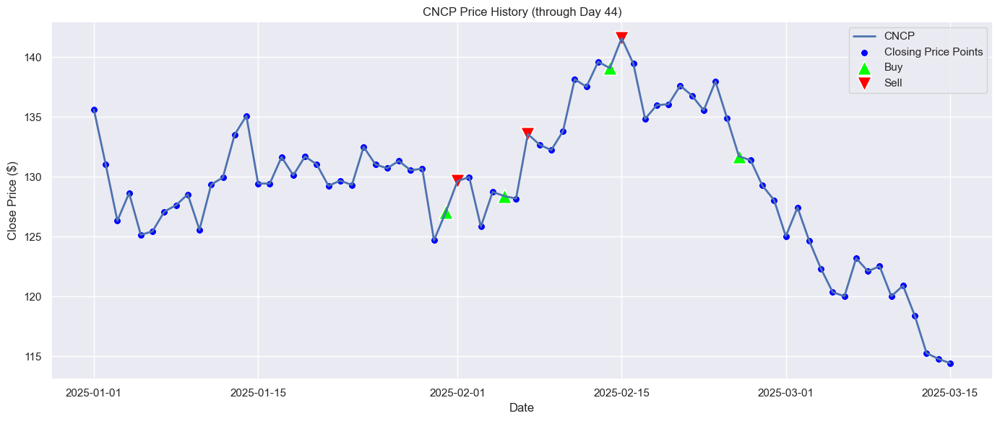

Today's Price: $114.44
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 45 of 100
Trading: Cencorp (CNCP) — 2025-03-16


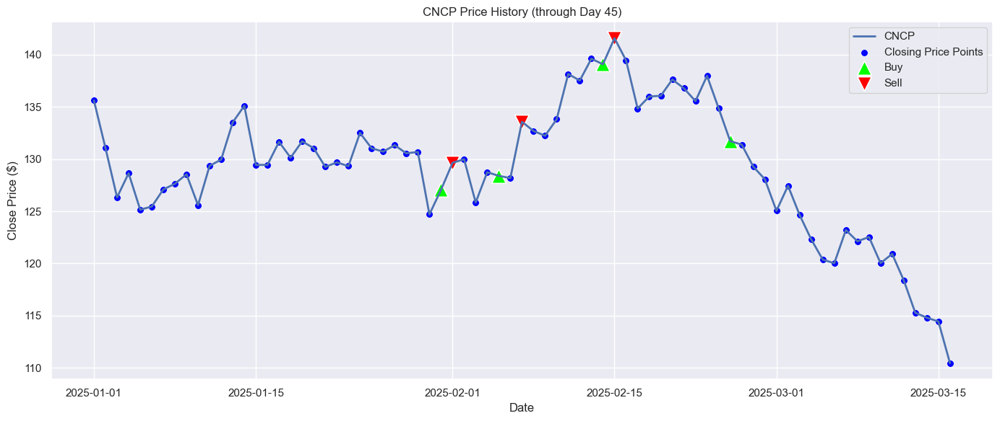

Today's Price: $110.45
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 46 of 100
Trading: Cencorp (CNCP) — 2025-03-17


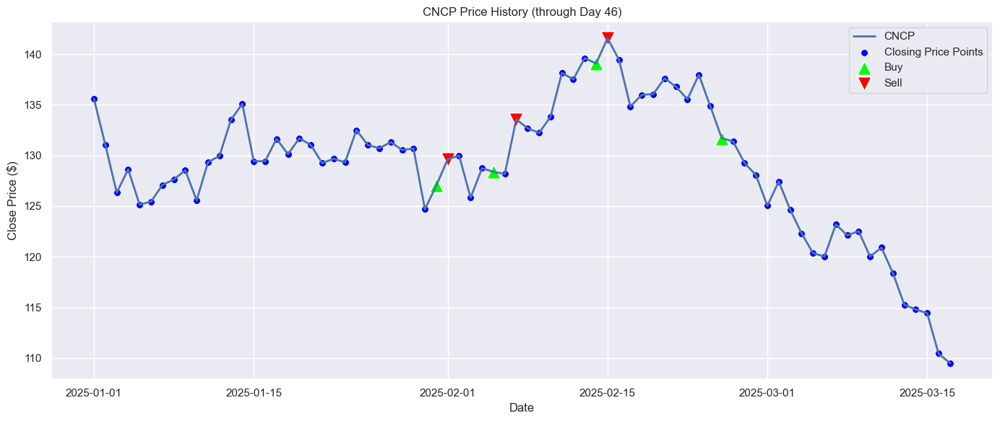

Today's Price: $109.51
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 47 of 100
Trading: Cencorp (CNCP) — 2025-03-18


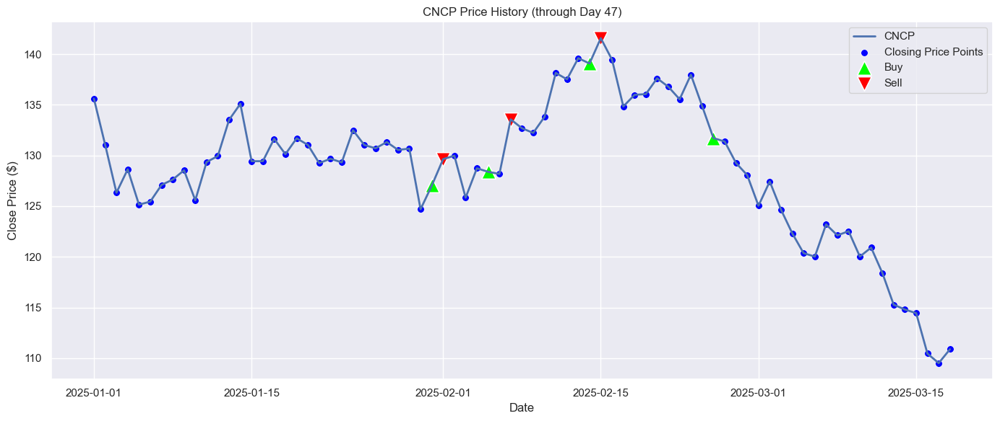

Today's Price: $110.88
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 48 of 100
Trading: Cencorp (CNCP) — 2025-03-19


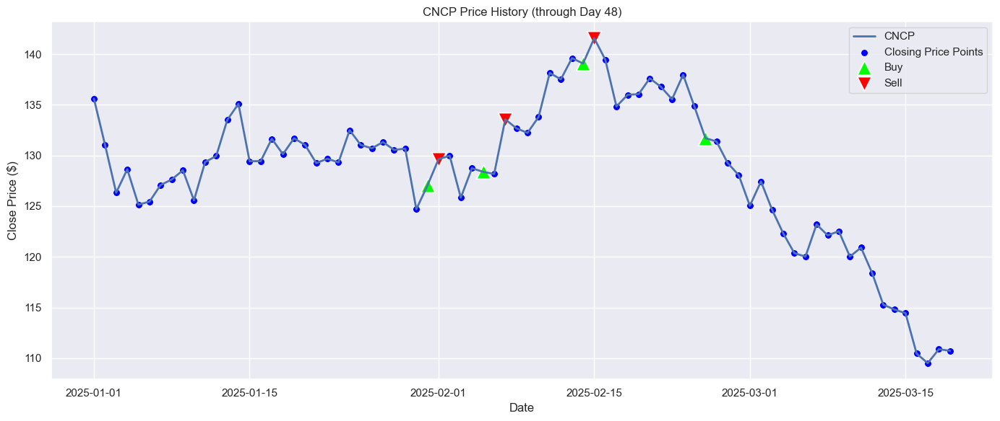

Today's Price: $110.73
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 49 of 100
Trading: Cencorp (CNCP) — 2025-03-20


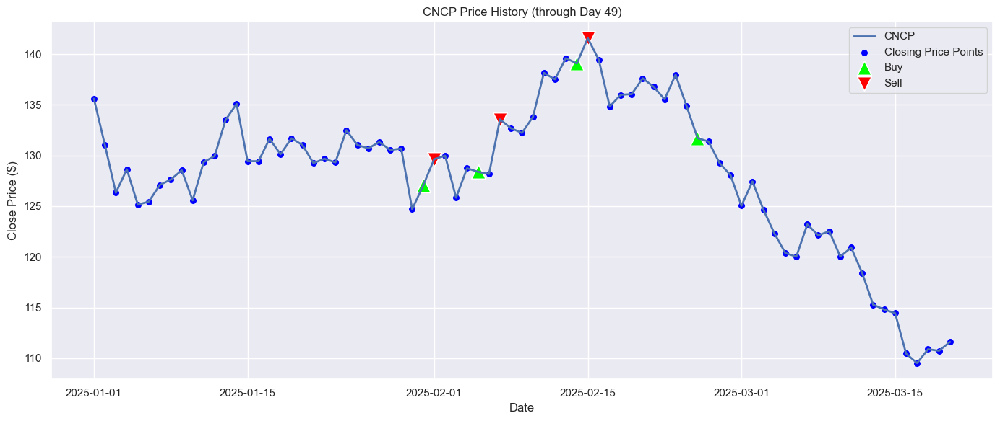

Today's Price: $111.60
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 50 of 100
Trading: Cencorp (CNCP) — 2025-03-21


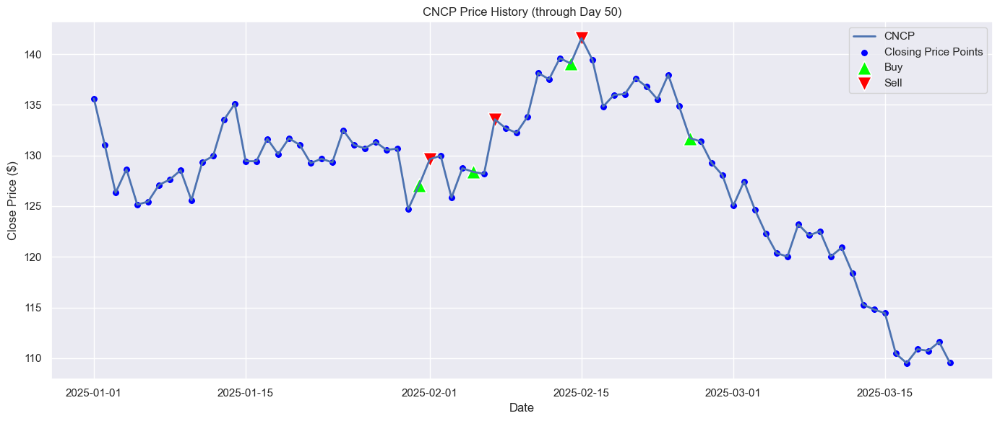

Today's Price: $109.53
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 51 of 100
Trading: Cencorp (CNCP) — 2025-03-22


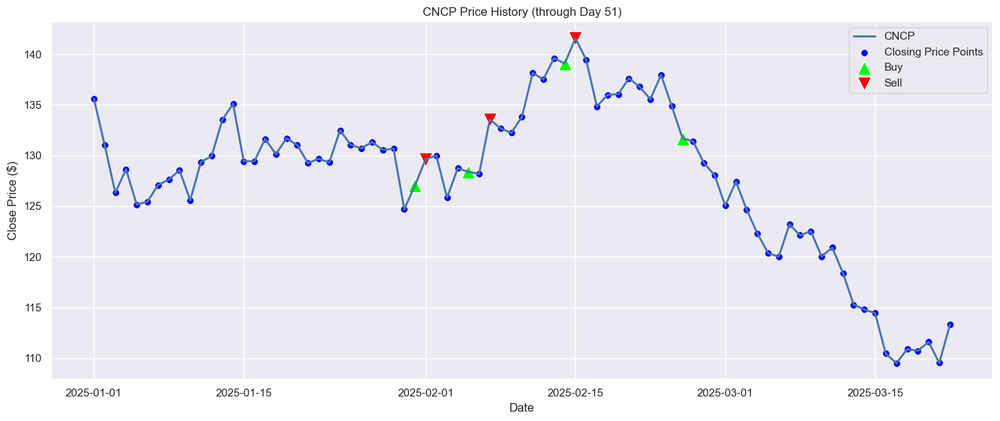

Today's Price: $113.30
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 52 of 100
Trading: Cencorp (CNCP) — 2025-03-23


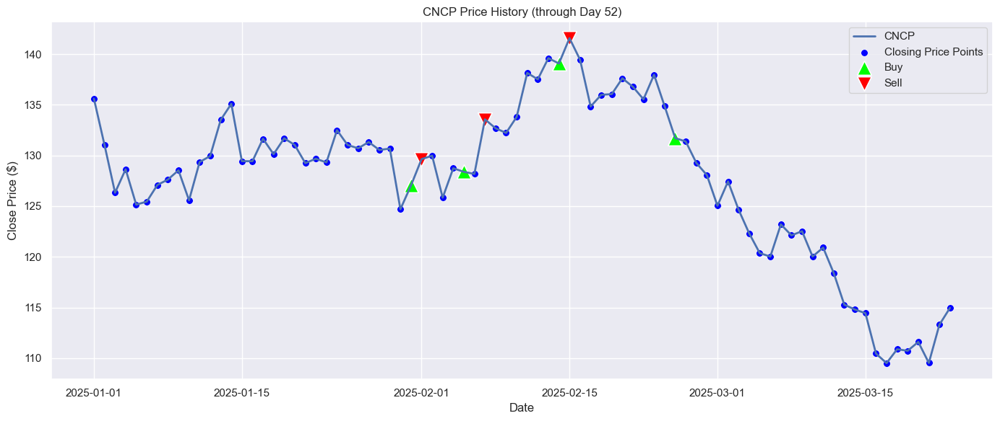

Today's Price: $114.96
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 53 of 100
Trading: Cencorp (CNCP) — 2025-03-24


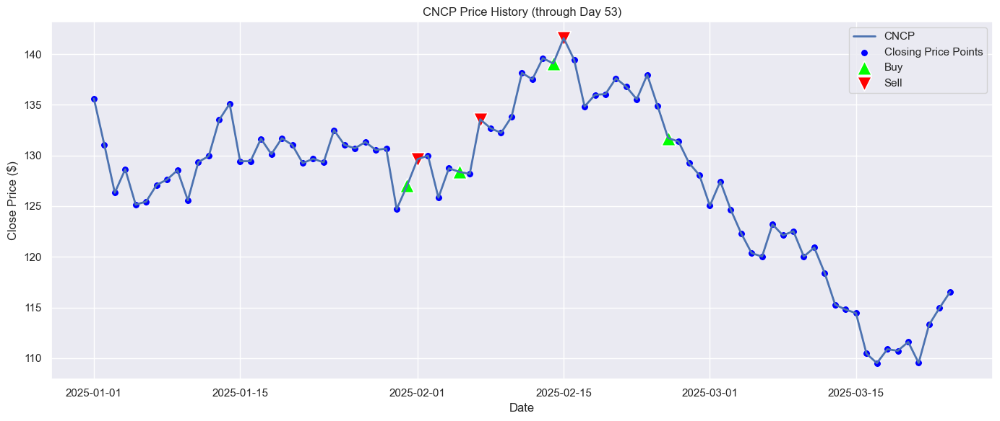

Today's Price: $116.52
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 54 of 100
Trading: Cencorp (CNCP) — 2025-03-25


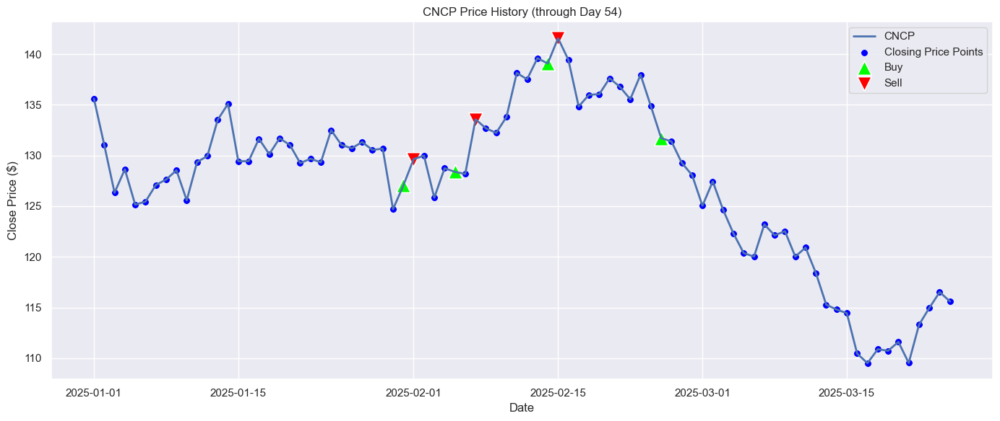

Today's Price: $115.60
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 55 of 100
Trading: Cencorp (CNCP) — 2025-03-26


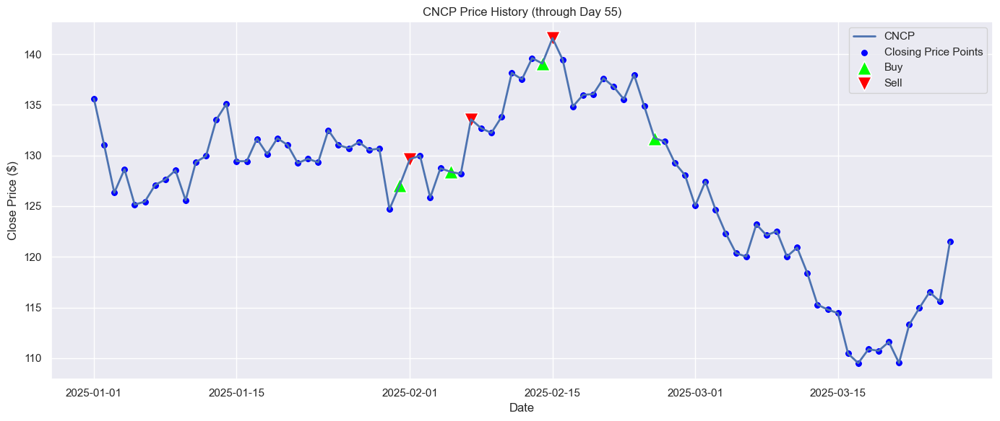

Today's Price: $121.48
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 56 of 100
Trading: Cencorp (CNCP) — 2025-03-27


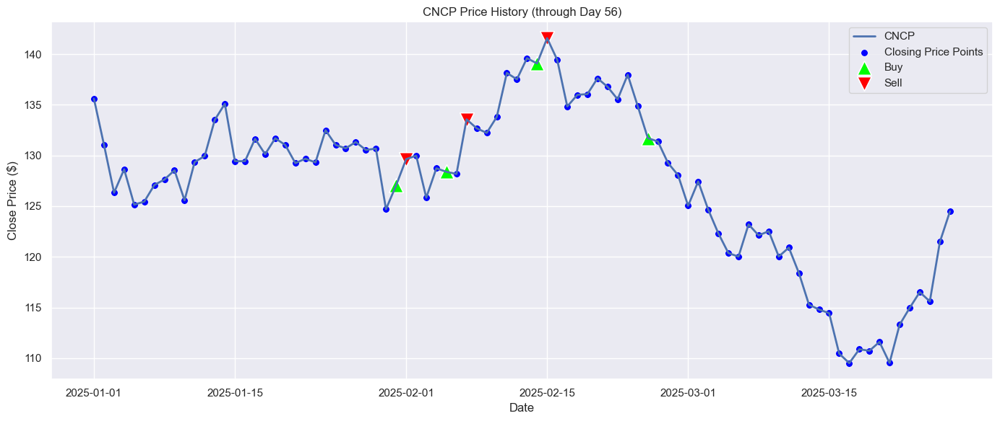

Today's Price: $124.49
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 57 of 100
Trading: Cencorp (CNCP) — 2025-03-28


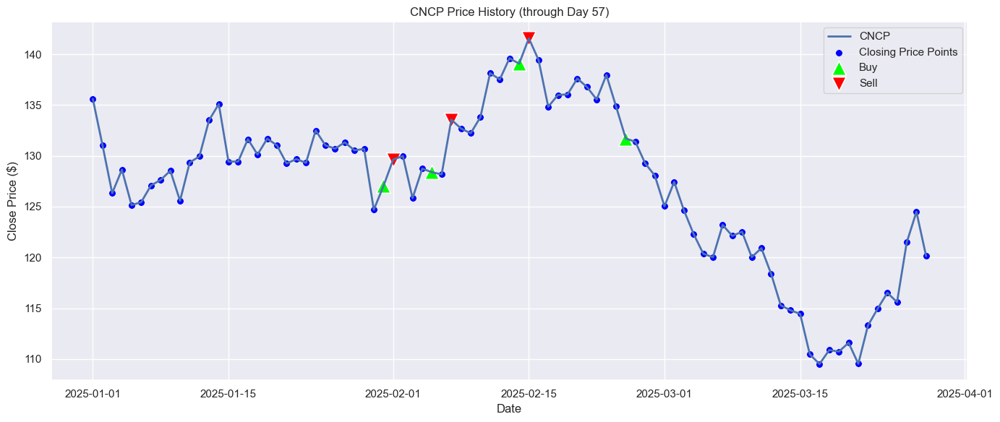

Today's Price: $120.13
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 58 of 100
Trading: Cencorp (CNCP) — 2025-03-29


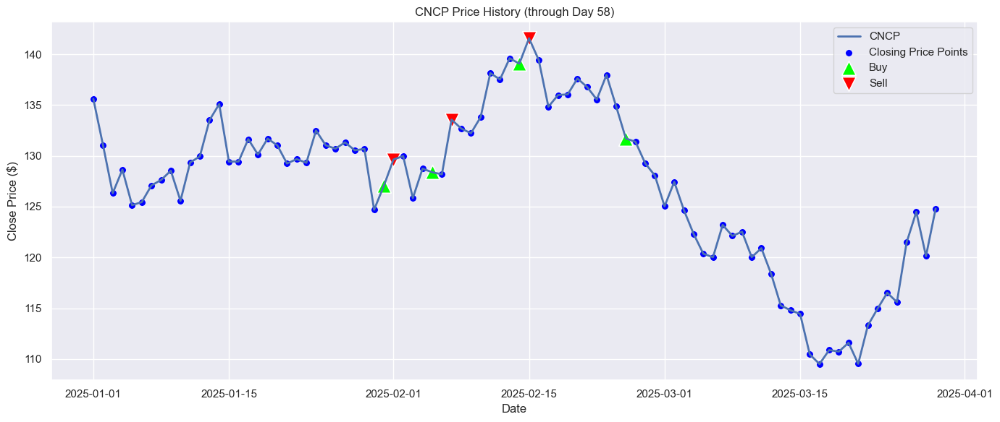

Today's Price: $124.81
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 59 of 100
Trading: Cencorp (CNCP) — 2025-03-30


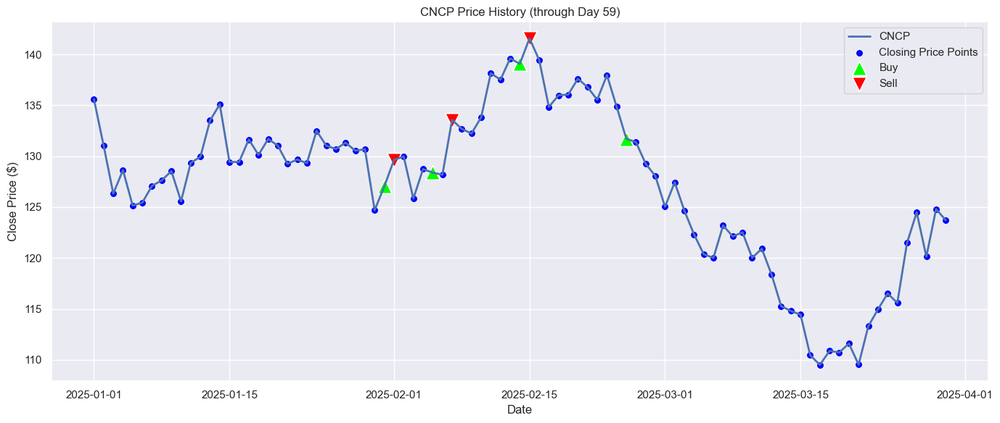

Today's Price: $123.73
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 60 of 100
Trading: Cencorp (CNCP) — 2025-03-31


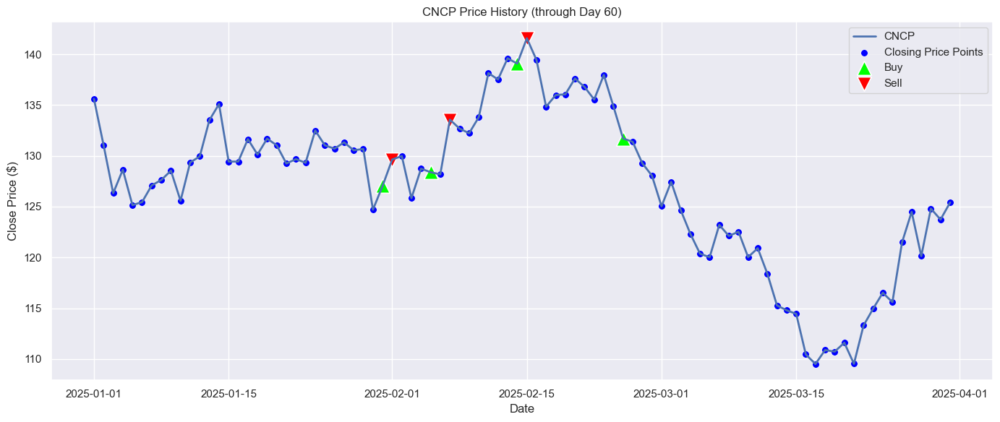

Today's Price: $125.41
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 61 of 100
Trading: Cencorp (CNCP) — 2025-04-01


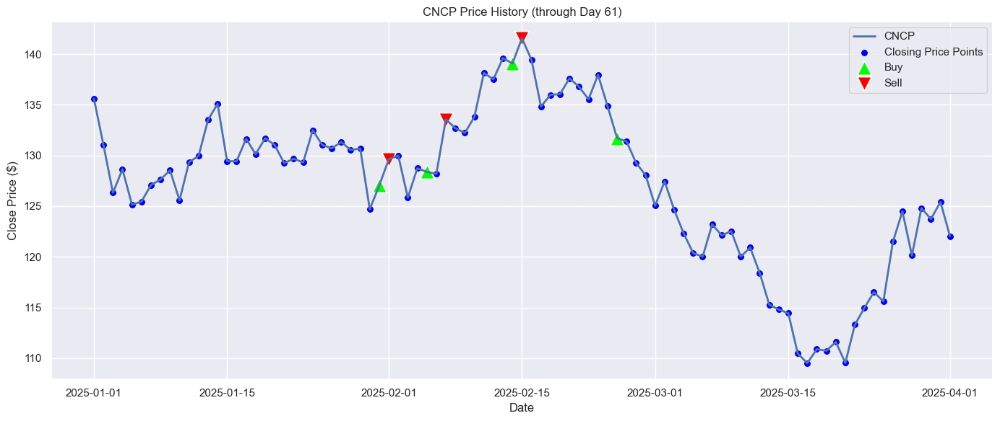

Today's Price: $122.04
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 62 of 100
Trading: Cencorp (CNCP) — 2025-04-02


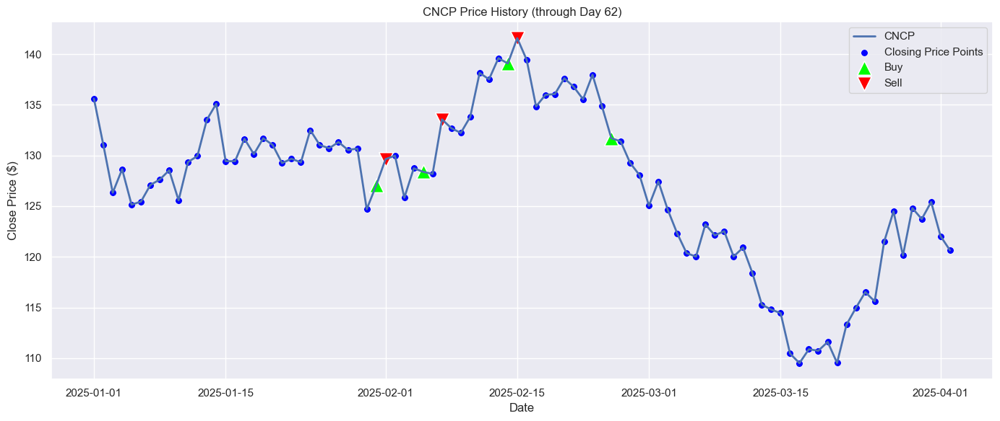

Today's Price: $120.65
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 63 of 100
Trading: Cencorp (CNCP) — 2025-04-03


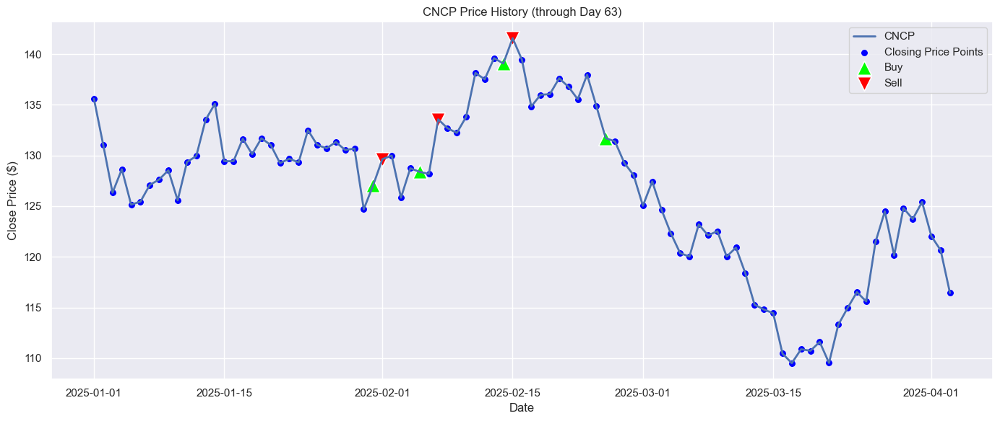

Today's Price: $116.43
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 64 of 100
Trading: Cencorp (CNCP) — 2025-04-04


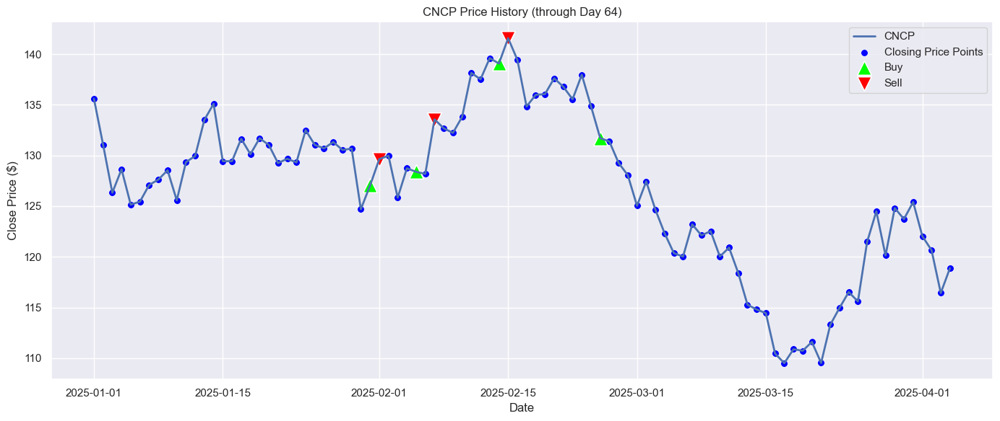

Today's Price: $118.89
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 65 of 100
Trading: Cencorp (CNCP) — 2025-04-05


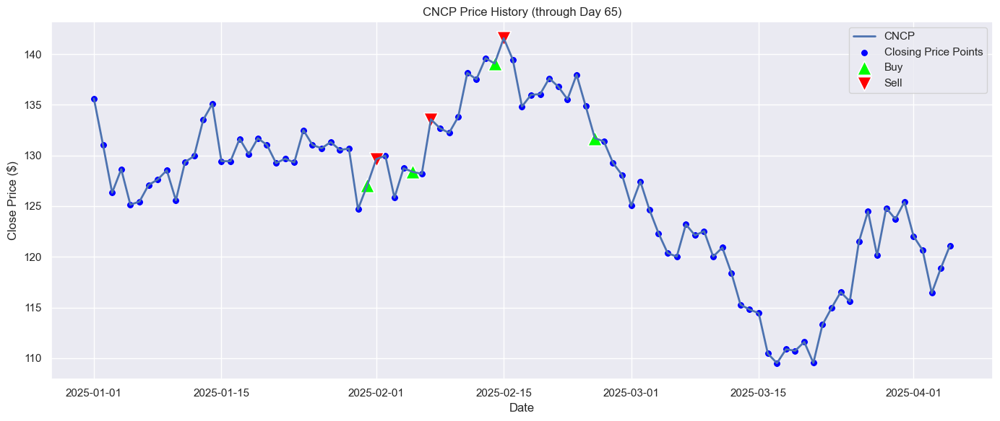

Today's Price: $121.11
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 66 of 100
Trading: Cencorp (CNCP) — 2025-04-06


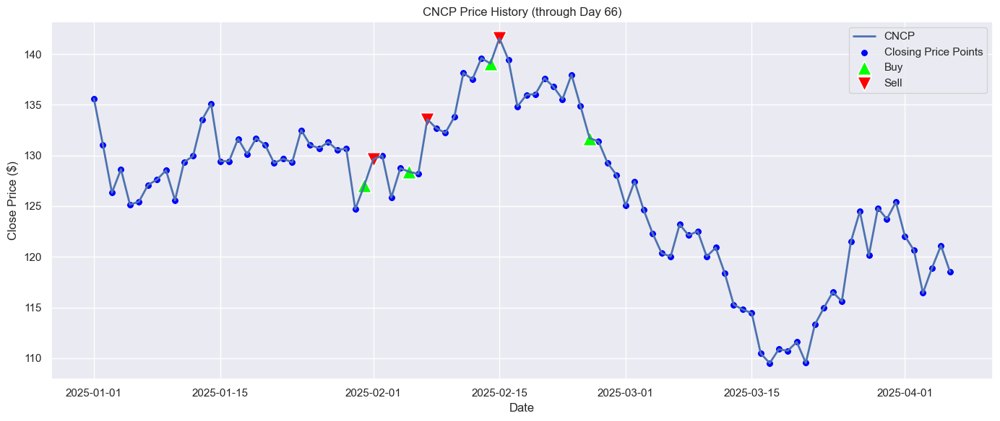

Today's Price: $118.53
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 67 of 100
Trading: Cencorp (CNCP) — 2025-04-07


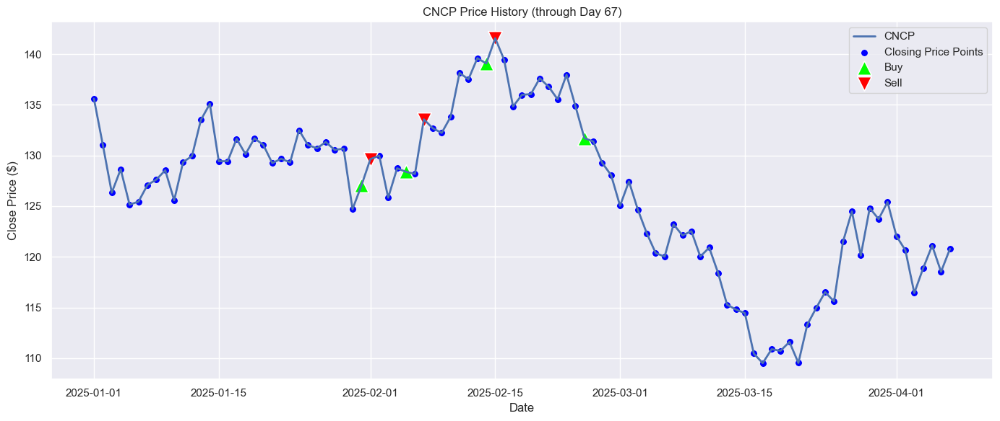

Today's Price: $120.79
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 68 of 100
Trading: Cencorp (CNCP) — 2025-04-08


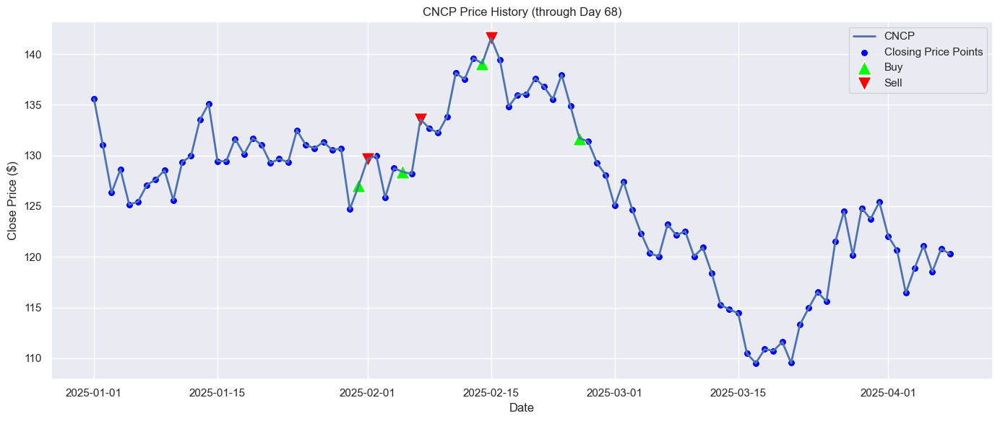

Today's Price: $120.28
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 69 of 100
Trading: Cencorp (CNCP) — 2025-04-09


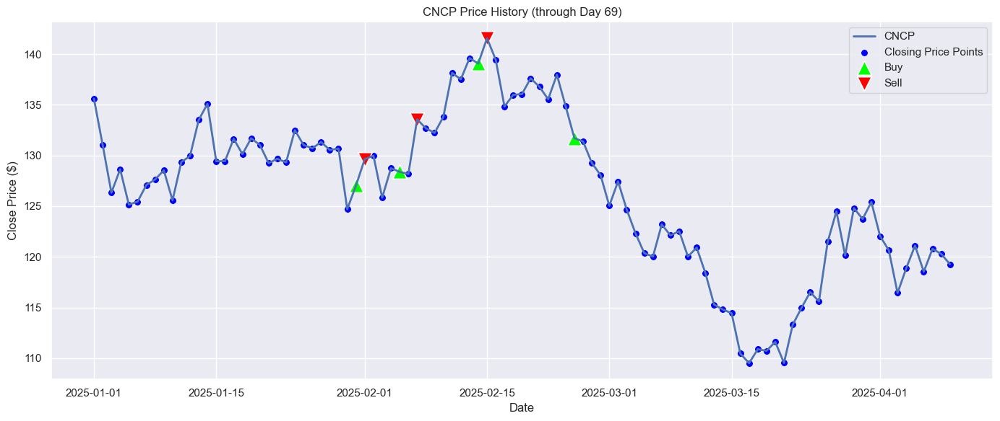

Today's Price: $119.27
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 70 of 100
Trading: Cencorp (CNCP) — 2025-04-10


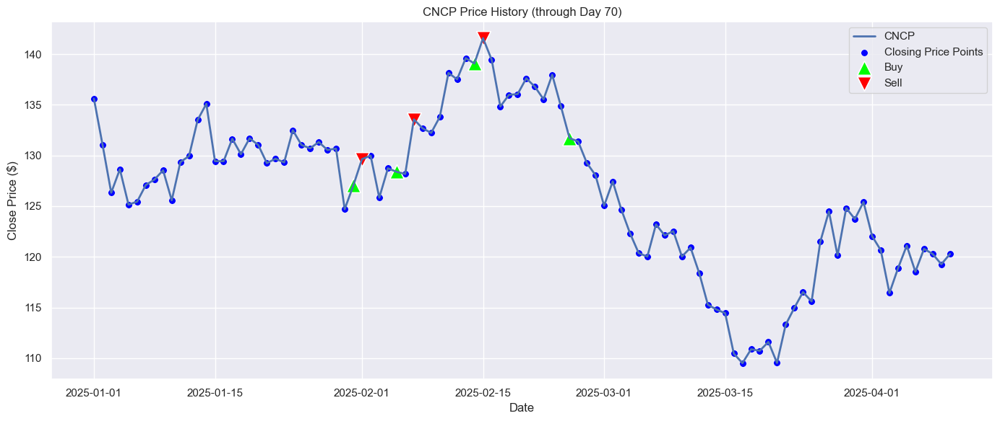

Today's Price: $120.28
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 71 of 100
Trading: Cencorp (CNCP) — 2025-04-11


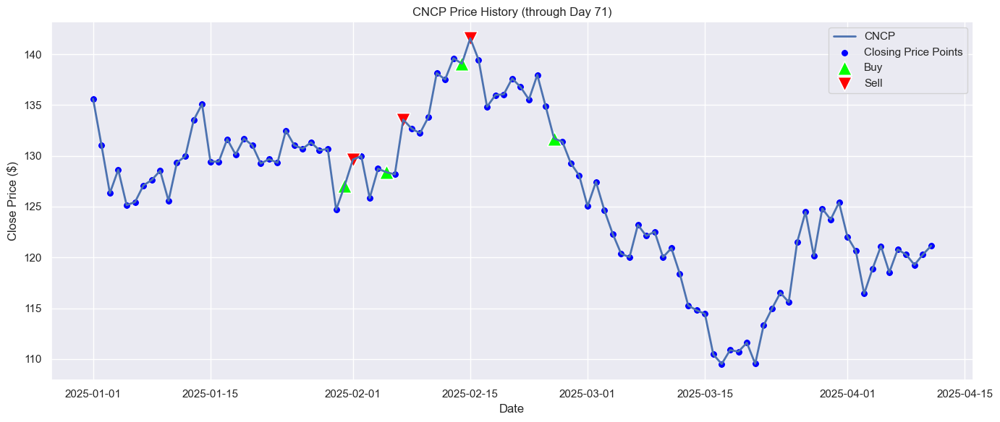

Today's Price: $121.15
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 72 of 100
Trading: Cencorp (CNCP) — 2025-04-12


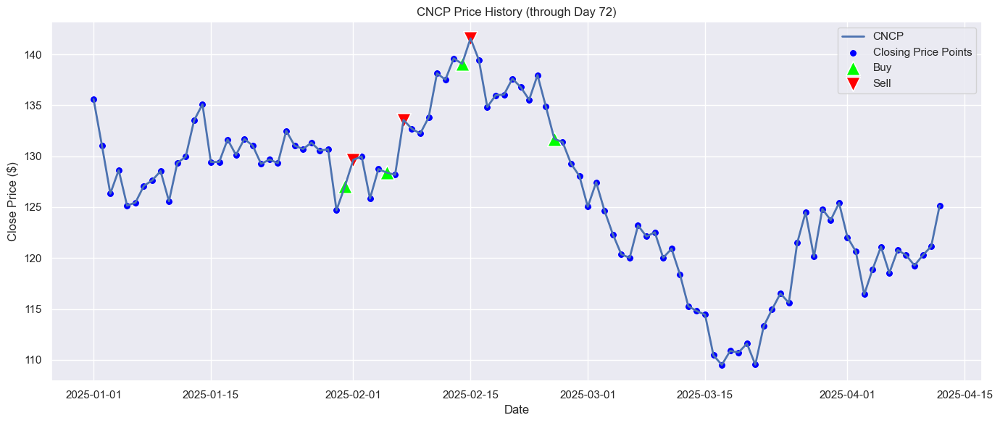

Today's Price: $125.14
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 73 of 100
Trading: Cencorp (CNCP) — 2025-04-13


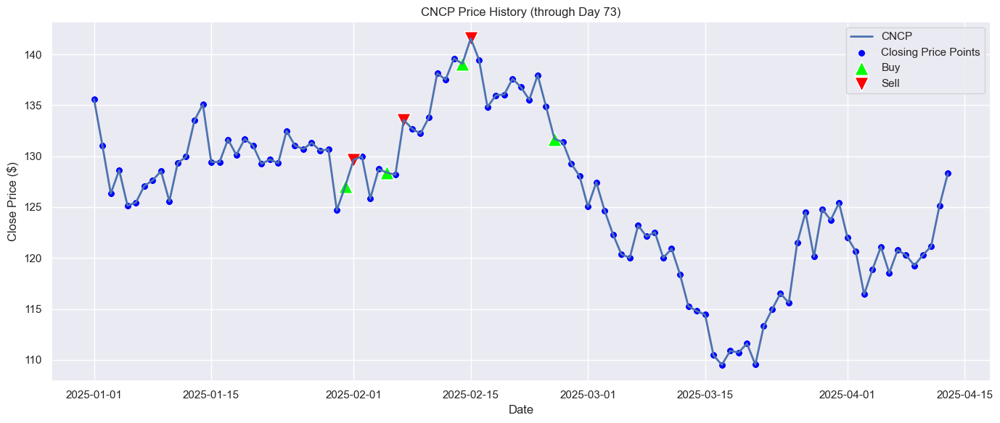

Today's Price: $128.31
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 74 of 100
Trading: Cencorp (CNCP) — 2025-04-14


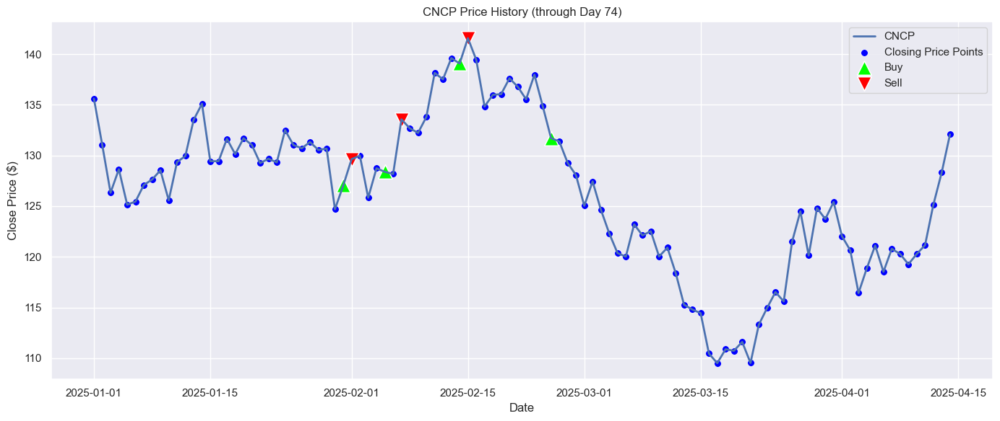

Today's Price: $132.08
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 75 of 100
Trading: Cencorp (CNCP) — 2025-04-15


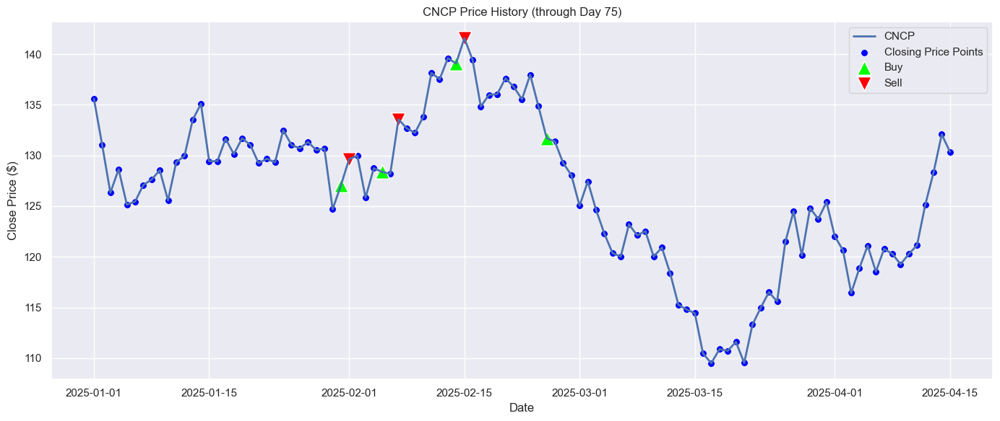

Today's Price: $130.36
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
Invalid input. Try again.

Day 75 of 100
Trading: Cencorp (CNCP) — 2025-04-15


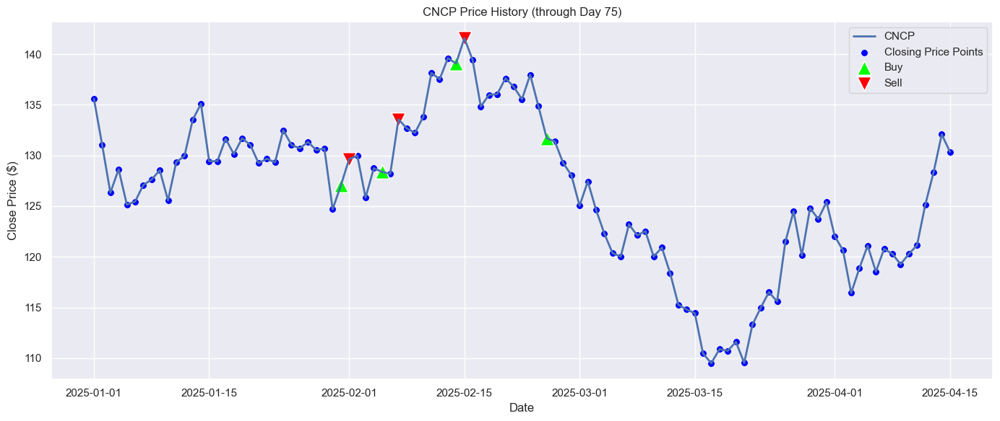

Today's Price: $130.36
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 76 of 100
Trading: Cencorp (CNCP) — 2025-04-16


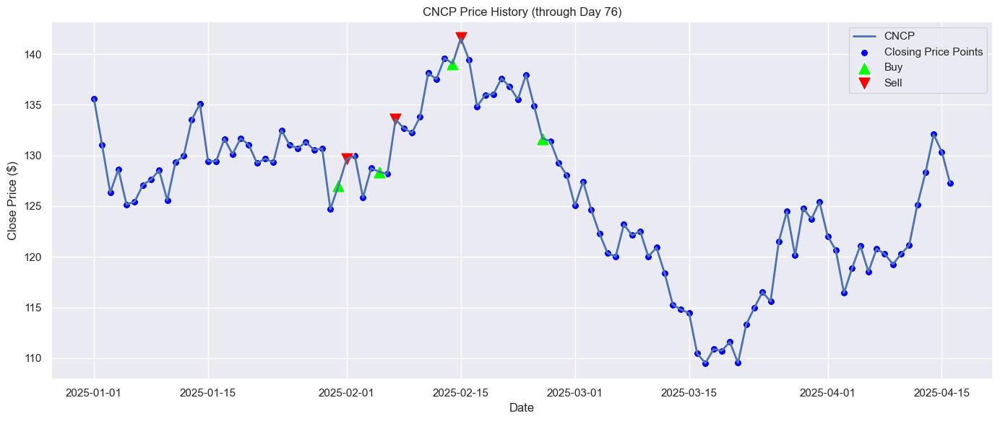

Today's Price: $127.30
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 77 of 100
Trading: Cencorp (CNCP) — 2025-04-17


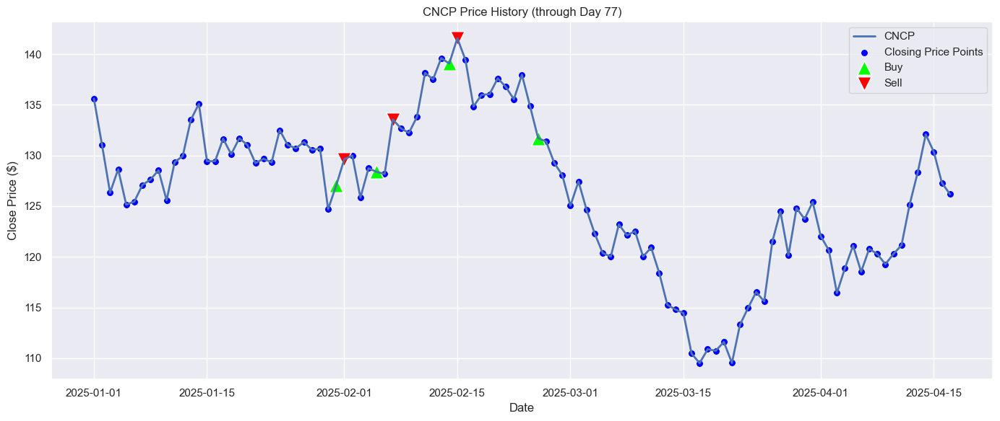

Today's Price: $126.18
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 78 of 100
Trading: Cencorp (CNCP) — 2025-04-18


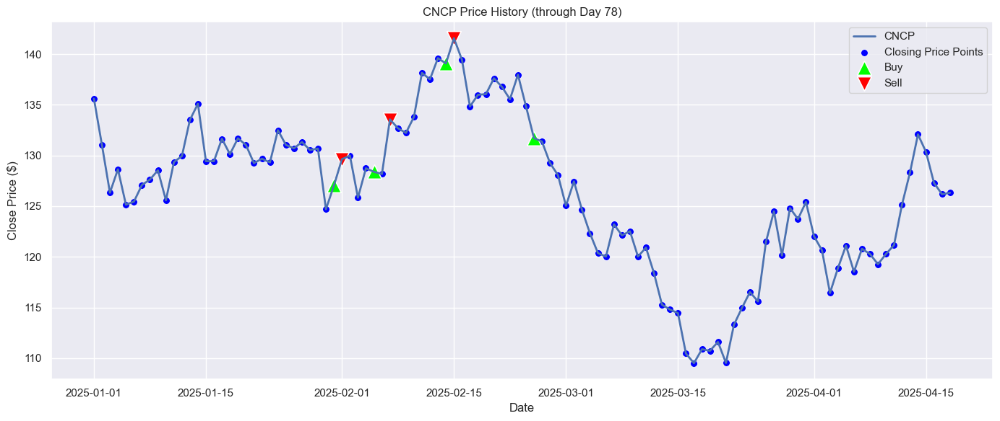

Today's Price: $126.32
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 79 of 100
Trading: Cencorp (CNCP) — 2025-04-19


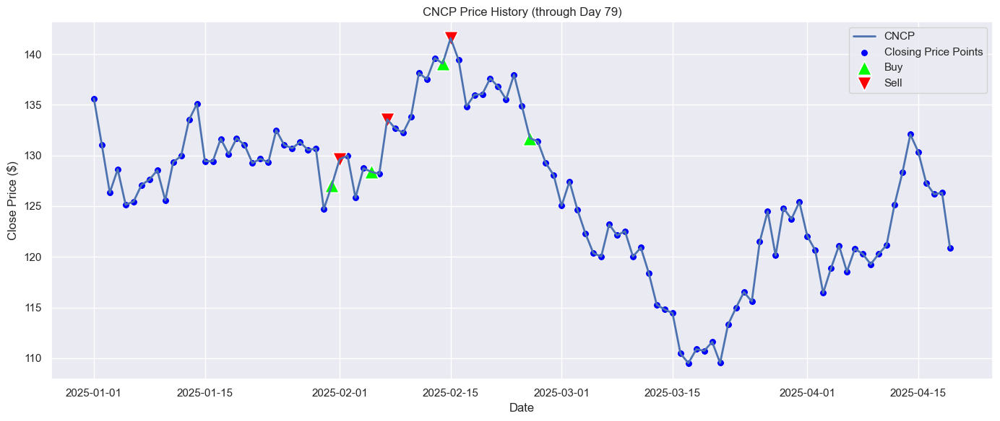

Today's Price: $120.88
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 80 of 100
Trading: Cencorp (CNCP) — 2025-04-20


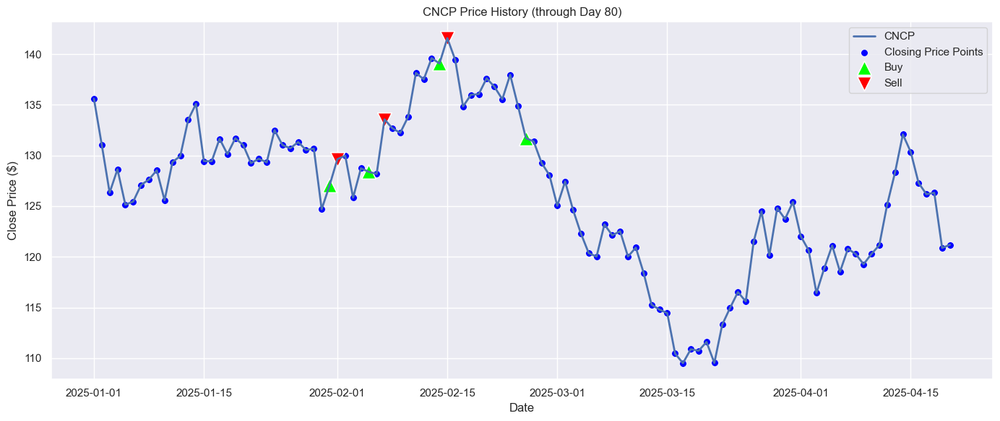

Today's Price: $121.19
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 81 of 100
Trading: Cencorp (CNCP) — 2025-04-21


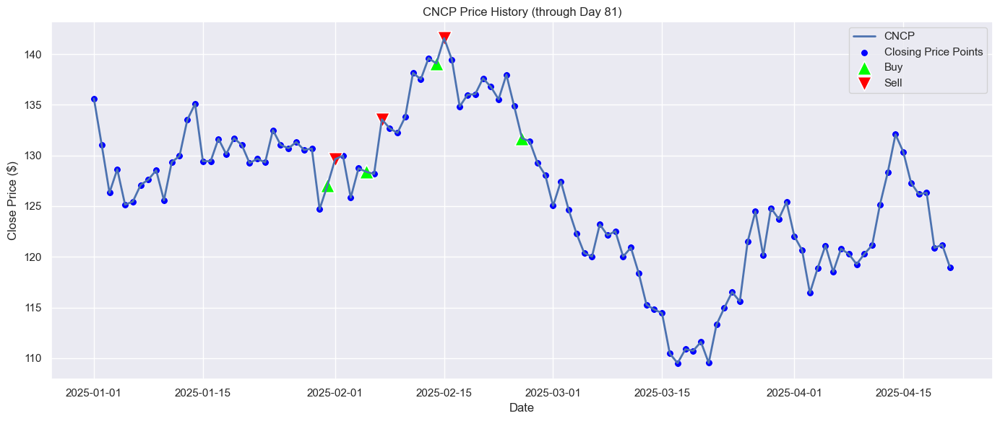

Today's Price: $118.97
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 82 of 100
Trading: Cencorp (CNCP) — 2025-04-22


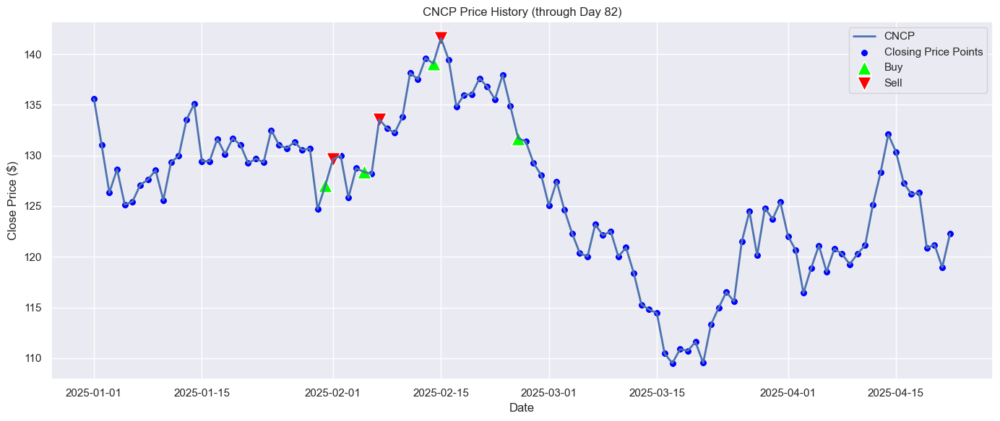

Today's Price: $122.27
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 83 of 100
Trading: Cencorp (CNCP) — 2025-04-23


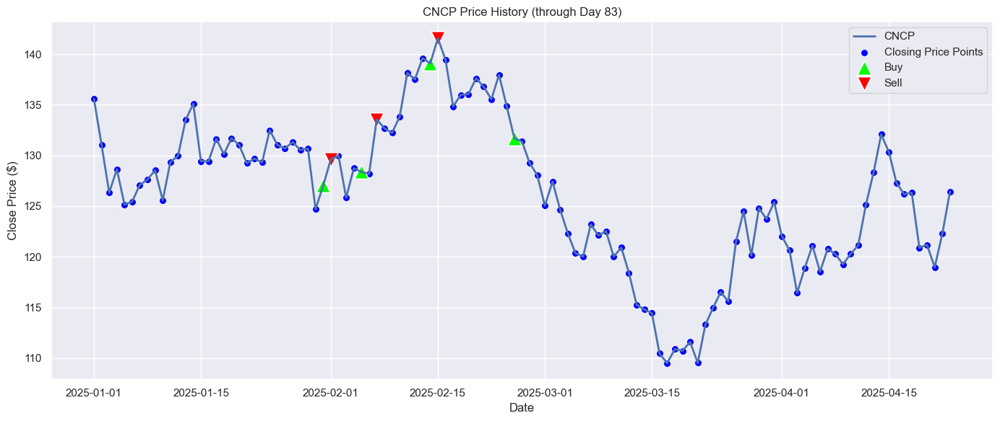

Today's Price: $126.43
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 84 of 100
Trading: Cencorp (CNCP) — 2025-04-24


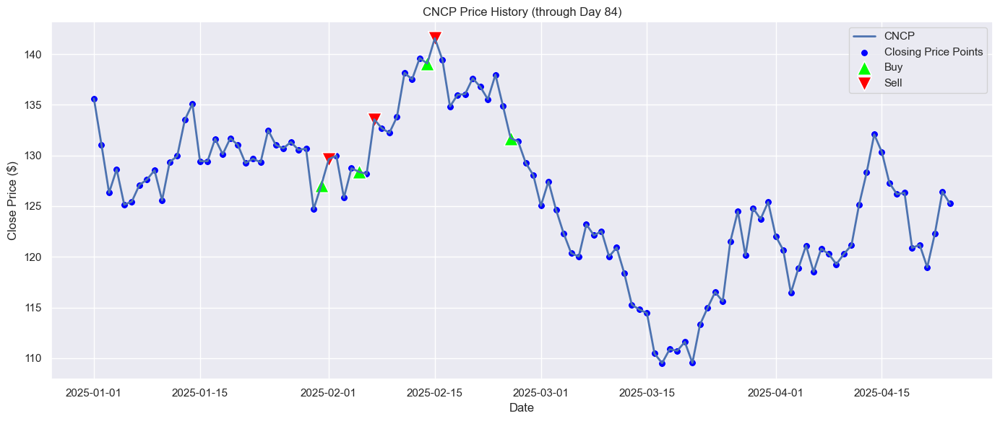

Today's Price: $125.25
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 85 of 100
Trading: Cencorp (CNCP) — 2025-04-25


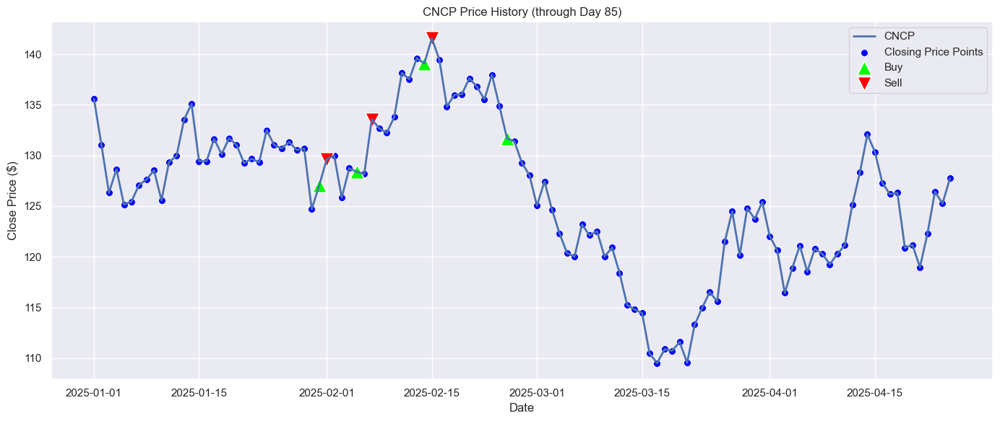

Today's Price: $127.75
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
You hold your position...

Day 86 of 100
Trading: Cencorp (CNCP) — 2025-04-26


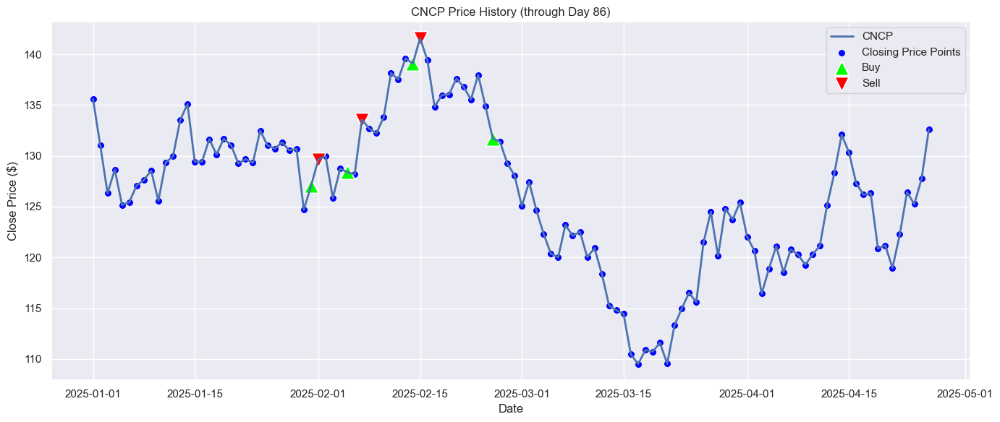

Today's Price: $132.61
Current Holdings:
  CNCP: 60 shares
Cash Balance: $2802.90
Sold 60 shares of CNCP at $132.61.

Day 87 of 100
Trading: Cencorp (CNCP) — 2025-04-27


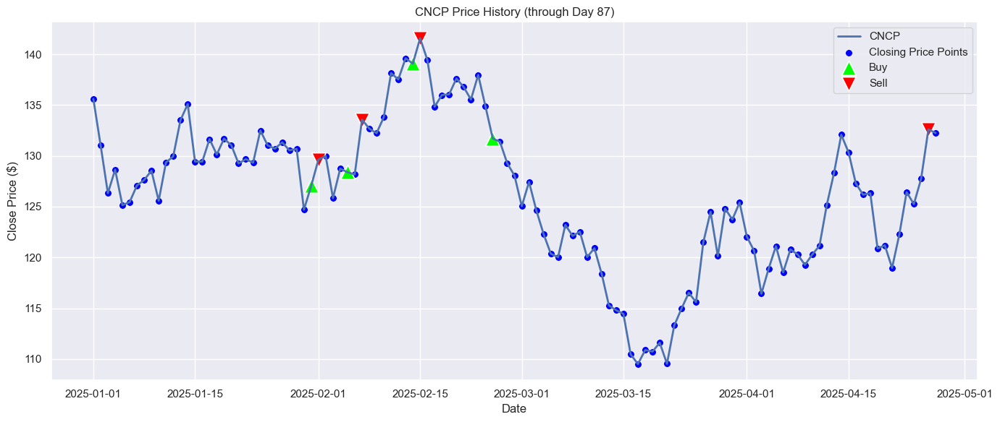

Today's Price: $132.25
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10759.50
You hold your position...

Day 88 of 100
Trading: Cencorp (CNCP) — 2025-04-28


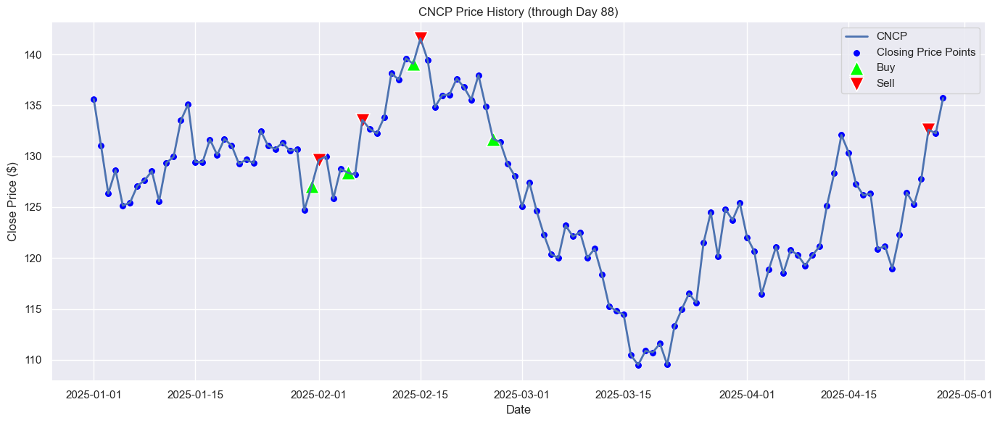

Today's Price: $135.71
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10759.50
You hold your position...

Day 89 of 100
Trading: Cencorp (CNCP) — 2025-04-29


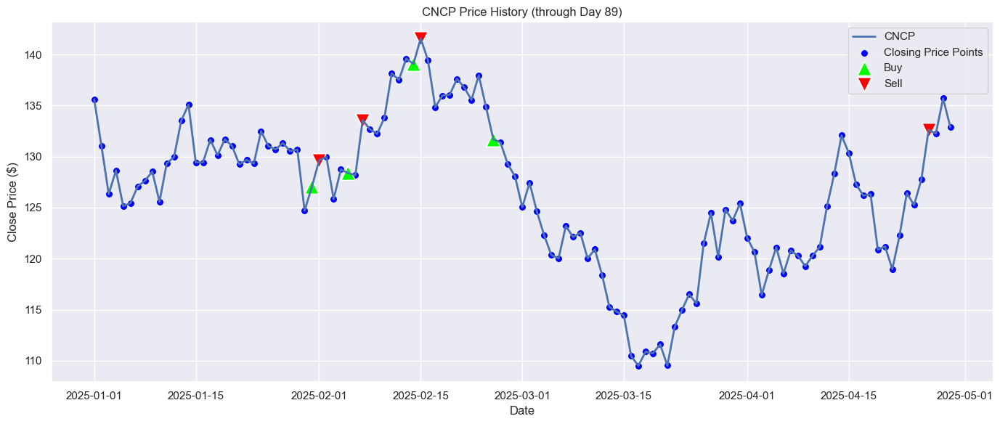

Today's Price: $132.87
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10759.50
You hold your position...

Day 90 of 100
Trading: Cencorp (CNCP) — 2025-04-30


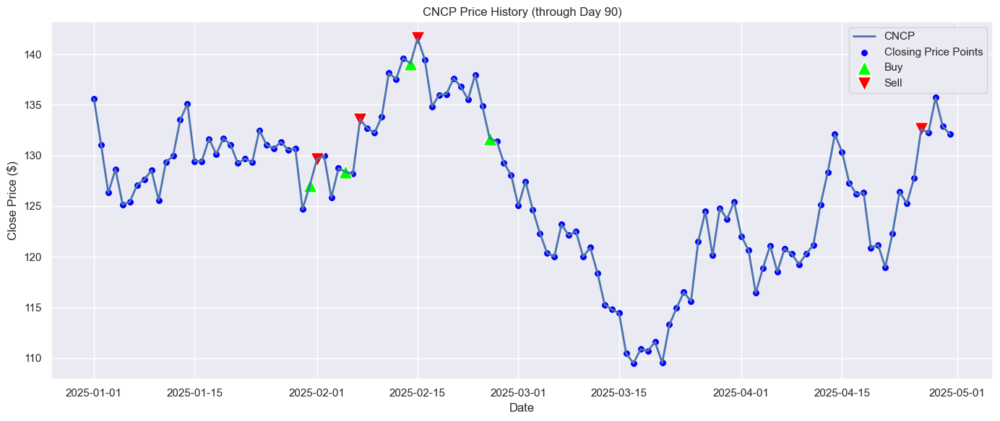

Today's Price: $132.09
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10759.50
You hold your position...

Day 91 of 100
Trading: Cencorp (CNCP) — 2025-05-01


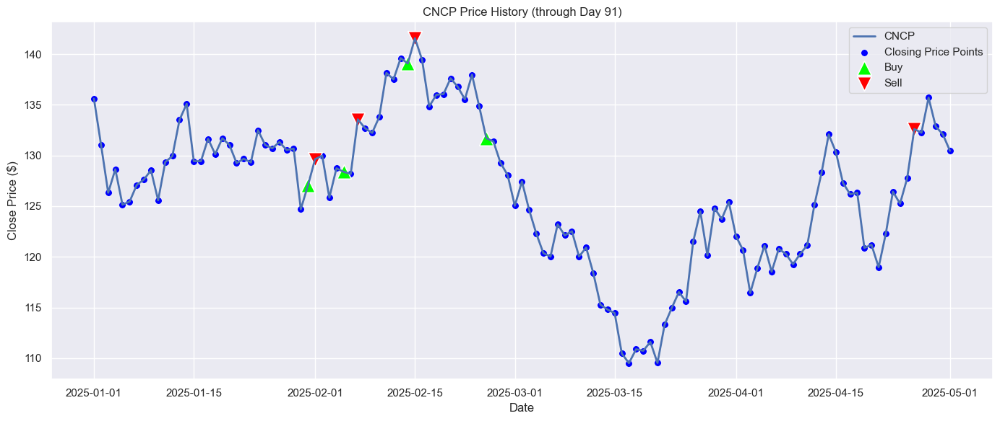

Today's Price: $130.46
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10759.50
You hold your position...

Day 92 of 100
Trading: Cencorp (CNCP) — 2025-05-02


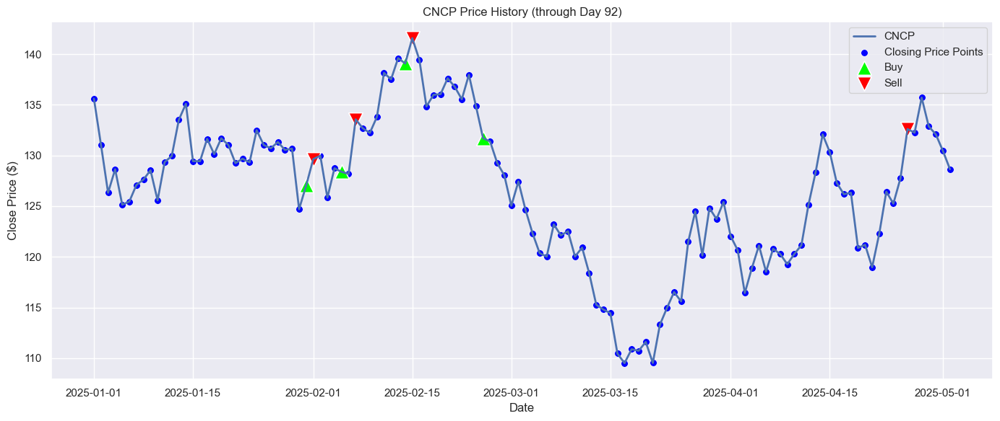

Today's Price: $128.65
Current Holdings:
  CNCP: 0 shares
Cash Balance: $10759.50
Bought 50 shares of CNCP at $128.65.

Day 93 of 100
Trading: Cencorp (CNCP) — 2025-05-03


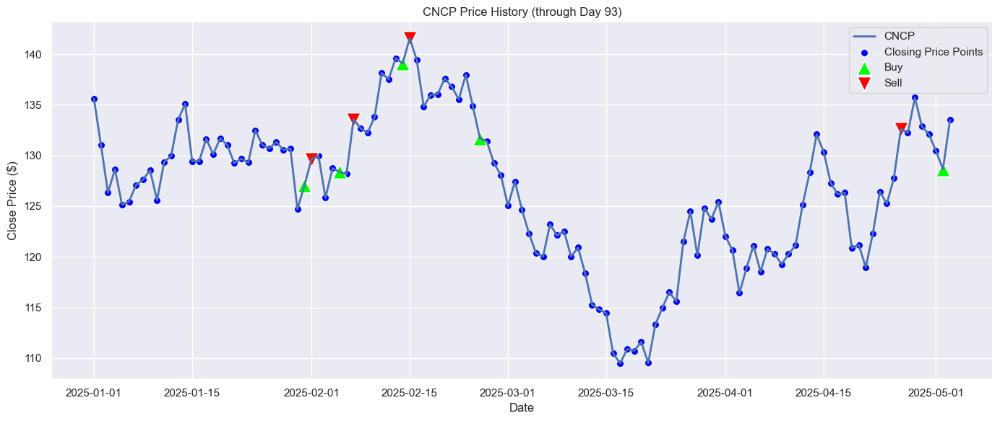

Today's Price: $133.51
Current Holdings:
  CNCP: 50 shares
Cash Balance: $4327.00
Sold 50 shares of CNCP at $133.51.

Day 94 of 100
Trading: Cencorp (CNCP) — 2025-05-04


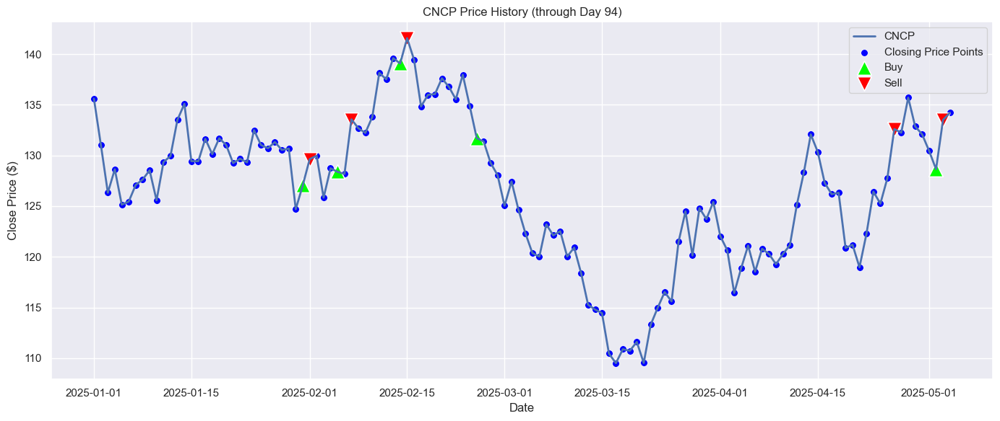

Today's Price: $134.22
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Day 95 of 100
Trading: Cencorp (CNCP) — 2025-05-05


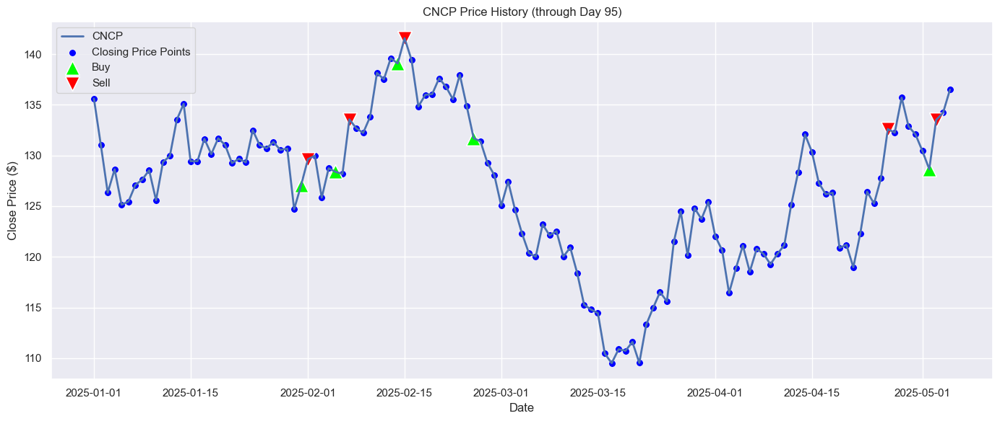

Today's Price: $136.50
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Day 96 of 100
Trading: Cencorp (CNCP) — 2025-05-06


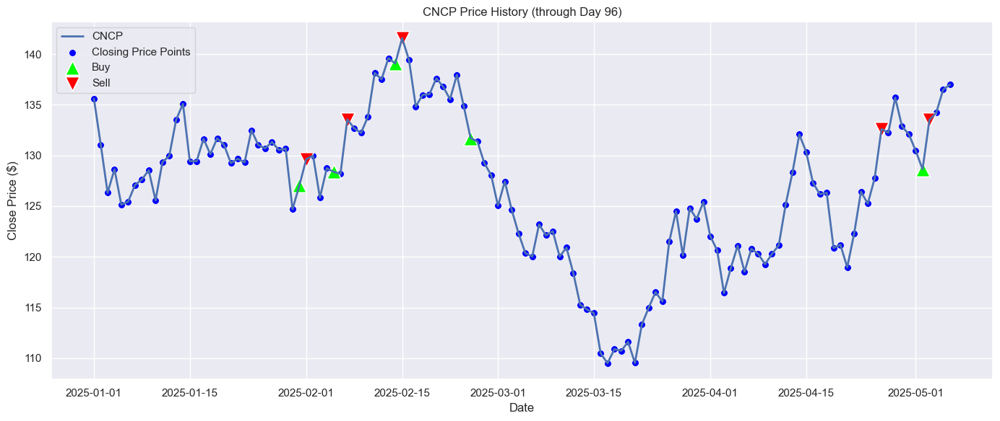

Today's Price: $137.00
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Day 97 of 100
Trading: Cencorp (CNCP) — 2025-05-07


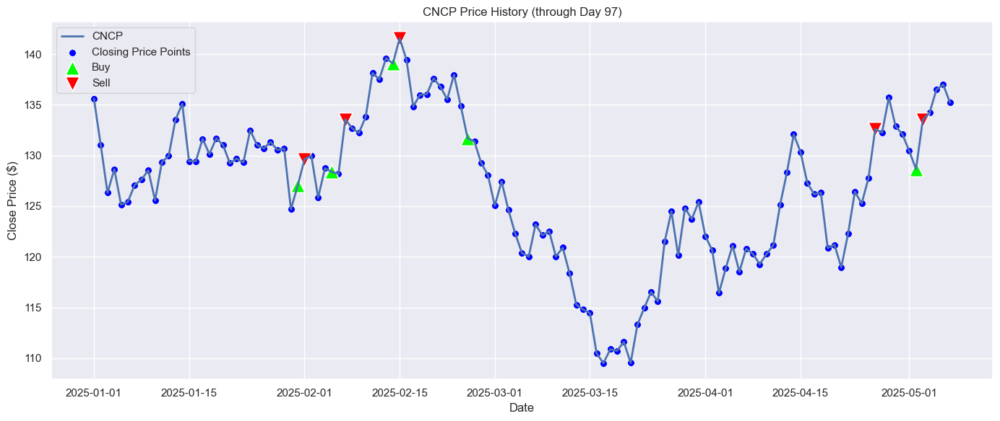

Today's Price: $135.23
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Day 98 of 100
Trading: Cencorp (CNCP) — 2025-05-08


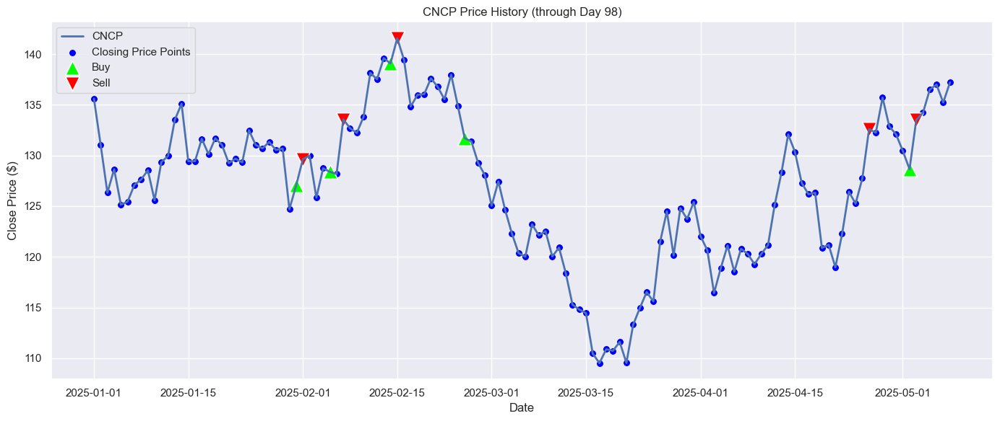

Today's Price: $137.21
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Day 99 of 100
Trading: Cencorp (CNCP) — 2025-05-09


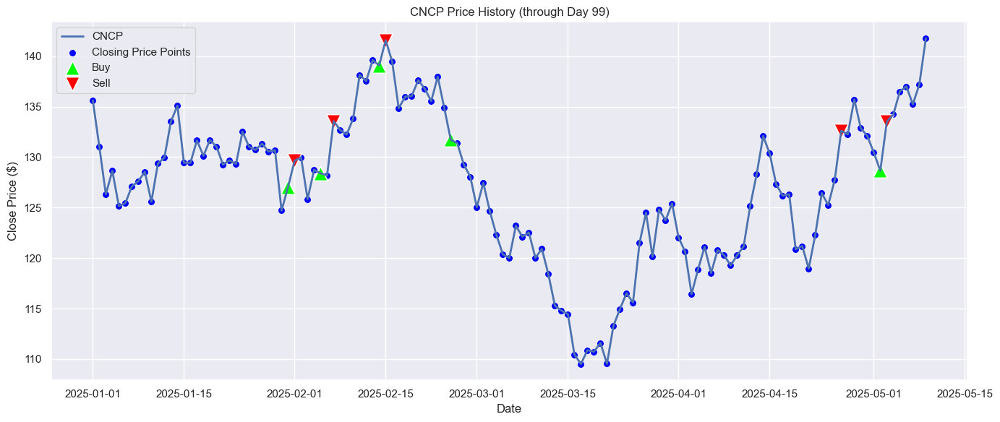

Today's Price: $141.77
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Day 100 of 100
Trading: Cencorp (CNCP) — 2025-05-10


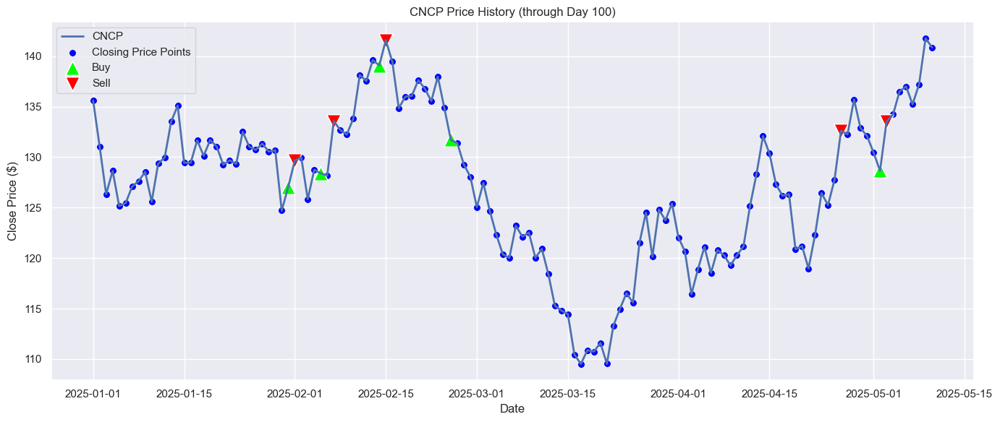

Today's Price: $140.86
Current Holdings:
  CNCP: 0 shares
Cash Balance: $11002.50
You hold your position...

Game Over!
Final Portfolio Value: $11002.50


In [44]:
# Assign a random stock to the player
available_stocks = market_df['Stock'].unique()
player_stock = np.random.choice(available_stocks)
player_ticker = market_df[market_df['Stock'] == player_stock]['Ticker'].iloc[0]

print(f'Your assigned stock is: {player_stock} ({player_ticker})')

dates = market_df['Date'].unique()
active = True

while current_day < max_day and player.cash > 0 and active:
    active_date = dates[current_day]
    print(f'\nDay {current_day - 29} of 100')
    print(f'Trading: {player_stock} ({player_ticker}) — {active_date.strftime("%Y-%m-%d")}')

    # === 1. Show price chart ===
    player_df = market_df[(market_df['Ticker'] == player_ticker) & 
                          (market_df['Date'] <= active_date)]

    plt.figure(figsize=(14, 6))
    sns.lineplot(data=player_df, x='Date', y='Close', label=player_ticker, linewidth=2)
    sns.scatterplot(data=player_df, x='Date', y='Close', marker='o', color='blue', s=50, label='Closing Price Points')

    # === PLOT TRADE HISTORY ===
    trades_df = pd.DataFrame(player.trades)
    if 'ticker' in trades_df.columns:
        trades_df = trades_df[trades_df['ticker'] == player_ticker]
        trades_df['Date'] = trades_df['day'].apply(lambda d: dates[d])  # map day index to date

        if not trades_df.empty:
            buy_df = trades_df[trades_df['type'] == 'buy']
            sell_df = trades_df[trades_df['type'] == 'sell']

            if not buy_df.empty:
                sns.scatterplot(data=buy_df, x='Date', y='price', marker='^', s=200, color='lime', label='Buy')

            if not sell_df.empty:
                sns.scatterplot(data=sell_df, x='Date', y='price', marker='v', s=200, color='red', label='Sell')

    plt.title(f'{player_ticker} Price History (through Day {current_day - 29})')
    plt.xlabel('Date')
    plt.ylabel('Close Price ($)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # === 2. Show today's price ===
    today_price = player_df[player_df['Date'] == active_date]['Close'].values[0]
    print(f'Today\'s Price: ${today_price:.2f}')

    # === 3. Show player status ===
    player.show_holdings()

    # === 4. Player input ===
    action = input('\n Action (buy/sell/hold/quit): ').lower()

    if action == 'buy':
        try:
            quantity = int(input(f'How many shares of {player_ticker} to BUY?: '))
        except ValueError:
            print("Invalid quantity.")
            continue
        player.buy(player_ticker, today_price, quantity, current_day)

    elif action == 'sell':
        owned = player.holdings.get(player_ticker, 0)
        if owned == 0:
            print('You don\'t own any shares to sell.')
        else:
            try:
                quantity = int(input(f'You own {owned} shares. How many to SELL?: '))
            except ValueError:
                print("Invalid quantity.")
                continue
            player.sell(player_ticker, today_price, quantity, current_day)

    elif action == 'hold':
        print('You hold your position...')

    elif action == 'quit':
        print('Exiting early.')
        active = False
        break

    else:
        print('Invalid input. Try again.')
        continue

    # === 5. Record portfolio value ===
    player.history.append(player.portfolio_value({player_ticker: today_price}))

    # === 6. Advance day ===
    current_day += 1

# === End of game ===
final_value = player.portfolio_value({player_ticker: today_price})
print('\nGame Over!')
print(f'Final Portfolio Value: ${final_value:.2f}')


### **Post-Game Strategy Comparison**

c:\Users\tobys\Downloads\strategies\sma_crossover_strategy.py:35: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df['Position'] = df['Signal'].replace(to_replace=0, method='ffill')
c:\Users\tobys\Downloads\strategies\ewma_crossover_strategy.py:35: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df['Position'] = df['Signal'].replace(to_replace=0, method='ffill')
c:\Users\tobys\Downloads\strategies\macd_strategy.py:37: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df['Position'] = df['Signal'].replace(to_replace=0, method='ffill')
c:\Users\tobys\Downloads\strategies\rsi_bollinger_strategy.py:50: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, s

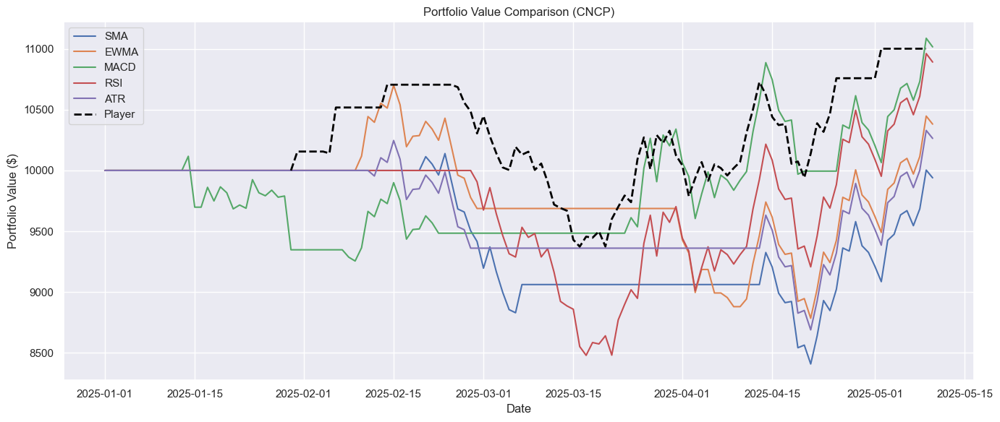


Final Portfolio Values:

Strategy Performance Summary:

Strategy  Final Value   ROI  Sharpe Ratio
    MACD     11017.38 10.17          0.90
  PLAYER     11002.50 10.02          1.27
     RSI     10892.43  8.92          0.79
    EWMA     10381.57  3.82          0.45
     ATR     10264.24  2.64          0.37
     SMA      9939.72 -0.60          0.03

Thank you for playing!


In [54]:
results = {}
for name, func in strategy_map.items():
    df = market_df[market_df['Ticker'] == player_ticker].copy()
    sim_df = simulate_strategy_portfolio(df, func)
    results[name] = sim_df

plt.figure(figsize=(14, 6))
for name, df in results.items():
    sns.lineplot(x=df['Date'], y=df['Portfolio'], label=name.upper())

# Add the player's actual portfolio history
plt.plot(dates[29:29 + len(player.history)], player.history, label='Player', linestyle='--', linewidth=2, color='black')

plt.title(f'Portfolio Value Comparison ({player_ticker})')
plt.xlabel('Date')
plt.ylabel('Portfolio Value ($)')
plt.legend()
plt.tight_layout()
plt.show()

print("\nFinal Portfolio Values:")
summary = []
for name, df in results.items():
    final_val = df['Portfolio'].iloc[-1]
    summary.append((name.upper(), f"${final_val:,.2f}"))
summary.append(('PLAYER', f"${final_value:,.2f}"))

# === Build summary DataFrame with ROI and Sharpe Ratio ===
summary_data = []

for name, df in results.items():
    final_val = df['Portfolio'].iloc[-1]
    roi = (final_val - 10000) / 10000

    daily_returns = df['Portfolio'].pct_change().dropna()
    sharpe = (daily_returns.mean() / daily_returns.std()) * np.sqrt(252) if not daily_returns.empty else 0

    summary_data.append((name.upper(), final_val, roi, sharpe))

# Player performance
player_roi = (final_value - 10000) / 10000
player_returns = pd.Series(player.history).pct_change().dropna()
player_sharpe = (player_returns.mean() / player_returns.std()) * np.sqrt(252) if not player_returns.empty else 0

summary_data.append(('PLAYER', final_value, player_roi, player_sharpe))

# Create DataFrame
summary_df = pd.DataFrame(summary_data, columns=['Strategy', 'Final Value', 'ROI', 'Sharpe Ratio'])
summary_df['Final Value'] = summary_df['Final Value'].round(2)
summary_df['ROI'] = (summary_df['ROI'] * 100).round(2)
summary_df['Sharpe Ratio'] = summary_df['Sharpe Ratio'].round(2)
summary_df = summary_df.sort_values(by='Final Value', ascending=False)

print("\nStrategy Performance Summary:\n")

#summary_df.head()
print(summary_df.to_string(index=False))

print("\nThank you for playing!")